## Installing packages

In [ ]:
pip install yfinance


In [ ]:
pip install python-louvain

## Importing the libraries

In [ ]:
import pandas as pd
import yfinance as yf
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import networkx as nx


## Data Acquisition and Preprocessing

### Data Fetching

In [ ]:
import pandas as pd
import yfinance as yf

# Fetch the S&P 500 companies' data from Wikipedia
sp500url = 'https://en.wikipedia.org/wiki/List_of_S%26P_500_companies'
data_table = pd.read_html(sp500url)
sp500_data = data_table[0]

# Manually replace tickers 'BRK.B' with 'BRK-B' and 'BF.B' with 'BF-B'
sp500_data['Symbol'] = sp500_data['Symbol'].replace('BRK.B', 'BRK-B').replace('BF.B', 'BF-B')

# Define sector abbreviations as per your provided mapping
sector_abbreviations = {
    'Communication Services': 'ComServ',
    'Consumer Discretionary': 'CD',
    'Consumer Staples': 'CS',
    'Energy': 'EN',
    'Financials': 'Fin',
    'Health Care': 'HC',
    'Industrials': 'IN',
    'Information Technology': 'IT',
    'Materials': 'MT',
    'Real Estate': 'RE',
    'Utilities': 'UT'
}

# Fetch full names and sectors for all companies
companies = sp500_data['Security'].tolist()
sectors = sp500_data['GICS Sector'].tolist()

# Initialize lists to store combined names
combined_names = []

# Combine sector abbreviation and company name
for company, sector in zip(companies, sectors):
    # Extract sector abbreviation
    sector_abbreviation = sector_abbreviations.get(sector, 'OT')  # 'OT' for 'Other' if not found

    # Combine sector abbreviation and company name
    combined_name = f"({sector_abbreviation}_{company})"
    combined_names.append(combined_name)

# Download the historical Adj Close prices for the valid tickers
tickers = sp500_data['Symbol'].tolist()
start_date = '2019-01-01'
end_date = '2019-12-31'
sp500_prices = yf.download(tickers, start=start_date, end=end_date)['Adj Close']

# Replace the tickers with combined names in the column names
sp500_prices.columns = combined_names

# Print the DataFrame with combined names
print(sp500_prices)


[*********************100%%**********************]  503 of 503 completed

ERROR:yfinance:
7 Failed downloads:
ERROR:yfinance:['VLTO', 'OTIS', 'ABNB', 'KVUE', 'CEG', 'CARR', 'GEHC']: Exception("%ticker%: Data doesn't exist for startDate = 1546318800, endDate = 1577768400")



              (IN_3M)  (IN_A. O. Smith)  (HC_Abbott)  (HC_AbbVie)  \
Date                                                                
2019-01-02  63.488911         31.963158    37.893322    70.646530   
2019-01-03  61.150002         29.581665    34.118881    68.318840   
2019-01-04  63.266617         31.530161    35.575382    70.519867   
2019-01-07  64.610023         32.425678    35.496212    71.549118   
2019-01-08  65.557198         31.904110    36.172878    71.881653   
...               ...               ...          ...          ...   
2019-12-23  82.931427         29.192120    69.170486    75.492065   
2019-12-24  82.970345         29.072563    69.236237    75.157478   
2019-12-26  83.116257         29.560759    70.609909    75.140747   
2019-12-27  83.087074         28.335287    70.583115    74.613770   
2019-12-30  82.755669         28.195801    71.002029    74.044952   

            (IT_Accenture)   (CS_ADM)  (IT_Adobe Inc.)    (IN_ADP)  \
Date                           

In [ ]:
sp500_prices.to_csv("sp2019.csv")

In [ ]:
import pandas as pd
import yfinance as yf

# Fetch the S&P 500 companies' data from Wikipedia
sp500url = 'https://en.wikipedia.org/wiki/List_of_S%26P_500_companies'
data_table = pd.read_html(sp500url)
sp500_data = data_table[0]

# Manually replace tickers 'BRK.B' with 'BRK-B' and 'BF.B' with 'BF-B'
sp500_data['Symbol'] = sp500_data['Symbol'].replace('BRK.B', 'BRK-B').replace('BF.B', 'BF-B')

# Define sector abbreviations as per your provided mapping
sector_abbreviations = {
    'Communication Services': 'ComServ',
    'Consumer Discretionary': 'CD',
    'Consumer Staples': 'CS',
    'Energy': 'EN',
    'Financials': 'Fin',
    'Health Care': 'HC',
    'Industrials': 'IN',
    'Information Technology': 'IT',
    'Materials': 'MT',
    'Real Estate': 'RE',
    'Utilities': 'UT'
}

# Fetch full names and sectors for all companies
companies = sp500_data['Security'].tolist()
sectors = sp500_data['GICS Sector'].tolist()

# Initialize lists to store combined names
combined_names = []

# Combine sector abbreviation and company name
for company, sector in zip(companies, sectors):
    # Extract sector abbreviation
    sector_abbreviation = sector_abbreviations.get(sector, 'OT')  # 'OT' for 'Other' if not found

    # Combine sector abbreviation and company name
    combined_name = f"({sector_abbreviation}_{company})"
    combined_names.append(combined_name)

# Download the historical Adj Close prices for the valid tickers
tickers = sp500_data['Symbol'].tolist()
start_date = '2020-01-01'
end_date = '2020-12-31'
sp500_20 = yf.download(tickers, start=start_date, end=end_date)['Adj Close']

# Replace the tickers with combined names in the column names
sp500_20.columns = combined_names

# Print the DataFrame with combined names
sp500_20


[*********************100%%**********************]  503 of 503 completed

ERROR:yfinance:
4 Failed downloads:
ERROR:yfinance:['VLTO', 'KVUE', 'CEG', 'GEHC']: Exception("%ticker%: Data doesn't exist for startDate = 1577854800, endDate = 1609390800")



[*********************100%%**********************]  504 of 503 completed

,(IN_3M),(IN_A. O. Smith),(HC_Abbott),(HC_AbbVie),(IT_Accenture),(CS_ADM),(IT_Adobe Inc.),(IN_ADP),(UT_AES Corporation),(Fin_Aflac),...,(Fin_Willis Towers Watson),(IN_W. W. Grainger),(CD_Wynn Resorts),(UT_Xcel Energy),(IN_Xylem Inc.),(CD_Yum! Brands),(IT_Zebra Technologies),(HC_Zimmer Biomet),(Fin_Zions Bancorporation),(HC_Zoetis)
Date,,,,,,,,,,,,,,,,,,,,,
2020-01-02,83.779129,28.982893,73.152664,74.906540,NaN,81.280243,43.400002,198.402542,334.429993,112.303558,...,141.295837,56.082611,57.528831,54.571384,76.070862,94.942879,140.791565,259.140015,45.666138,130.488556
2020-01-03,82.433975,27.548195,72.441444,74.195518,NaN,80.289375,43.349998,198.072128,331.809998,110.326599,...,139.199997,56.352329,57.066322,53.967487,76.518631,94.645531,140.423584,256.049988,45.021736,130.508041
2020-01-06,82.677673,27.219410,73.018692,74.781052,NaN,80.710030,43.520000,196.778687,333.709991,109.030403,...,138.924515,56.271408,57.504490,54.264645,76.023247,94.589767,139.612045,258.010010,44.473106,129.506088
2020-01-07,82.931122,27.119778,72.675293,74.354454,NaN,80.261337,43.160000,192.530243,333.390015,111.510910,...,139.583740,56.154533,57.033878,54.552219,75.737427,94.757027,139.489365,256.470001,44.203159,129.943832
2020-01-08,83.749886,27.737495,73.844360,74.881424,NaN,80.588509,42.730000,192.907867,337.869995,112.518036,...,140.459457,56.100590,56.173794,55.127354,75.994652,94.924324,141.159592,247.639999,44.638561,129.661713
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-23,115.076118,15.890000,128.687241,91.173935,158.009995,102.027061,35.080002,246.950729,496.910004,136.309586,...,114.401932,59.337597,36.599270,49.942631,96.266678,101.145584,141.476349,379.739990,39.321720,156.389603
2020-12-24,115.085930,15.660000,129.679749,91.156288,154.839996,102.881638,34.860001,246.816391,499.859985,137.499268,...,113.499001,59.632854,36.450310,50.145840,96.768616,101.855949,141.961456,376.890015,39.168095,157.240753
2020-12-28,115.596069,16.059999,134.317810,91.324013,149.000000,102.349915,35.330002,249.099426,498.950012,137.699142,...,114.570595,60.269508,36.572979,50.620003,96.884453,103.977539,141.619080,382.589996,39.186165,158.874588


In [ ]:
sp500_20.to_csv("sp2020.csv")

In [ ]:
import pandas as pd
import yfinance as yf

# Fetch the S&P 500 companies' data from Wikipedia
sp500url = 'https://en.wikipedia.org/wiki/List_of_S%26P_500_companies'
data_table = pd.read_html(sp500url)
sp500_data = data_table[0]

# Manually replace tickers 'BRK.B' with 'BRK-B' and 'BF.B' with 'BF-B'
sp500_data['Symbol'] = sp500_data['Symbol'].replace('BRK.B', 'BRK-B').replace('BF.B', 'BF-B')

# Define sector abbreviations as per your provided mapping
sector_abbreviations = {
    'Communication Services': 'ComServ',
    'Consumer Discretionary': 'CD',
    'Consumer Staples': 'CS',
    'Energy': 'EN',
    'Financials': 'Fin',
    'Health Care': 'HC',
    'Industrials': 'IN',
    'Information Technology': 'IT',
    'Materials': 'MT',
    'Real Estate': 'RE',
    'Utilities': 'UT'
}

# Fetch full names and sectors for all companies
companies = sp500_data['Security'].tolist()
sectors = sp500_data['GICS Sector'].tolist()

# Initialize lists to store combined names
combined_names = []

# Combine sector abbreviation and company name
for company, sector in zip(companies, sectors):
    # Extract sector abbreviation
    sector_abbreviation = sector_abbreviations.get(sector, 'OT')  # 'OT' for 'Other' if not found

    # Combine sector abbreviation and company name
    combined_name = f"({sector_abbreviation}_{company})"
    combined_names.append(combined_name)

# Download the historical Adj Close prices for the valid tickers
tickers = sp500_data['Symbol'].tolist()
start_date = '2021-01-01'
end_date = '2021-12-31'
sp500_21 = yf.download(tickers, start=start_date, end=end_date)['Adj Close']

# Replace the tickers with combined names in the column names
sp500_21.columns = combined_names

# Print the DataFrame with combined names
sp500_21


[*********************100%%**********************]  503 of 503 completed

ERROR:yfinance:
4 Failed downloads:
ERROR:yfinance:['GEHC', 'KVUE', 'VLTO', 'CEG']: Exception("%ticker%: Data doesn't exist for startDate = 1609477200, endDate = 1640926800")


,(IN_3M),(IN_A. O. Smith),(HC_Abbott),(HC_AbbVie),(IT_Accenture),(CS_ADM),(IT_Adobe Inc.),(IN_ADP),(UT_AES Corporation),(Fin_Aflac),...,(Fin_Willis Towers Watson),(IN_W. W. Grainger),(CD_Wynn Resorts),(UT_Xcel Energy),(IN_Xylem Inc.),(CD_Yum! Brands),(IT_Zebra Technologies),(HC_Zimmer Biomet),(Fin_Zions Bancorporation),(HC_Zoetis)
Date,,,,,,,,,,,,,,,,,,,,,
2021-01-04,116.581589,15.130000,127.164169,93.054268,139.149994,103.603279,34.900002,246.010635,485.339996,138.974503,...,106.067352,60.583218,36.362690,52.013485,96.228073,100.226845,145.680542,378.130005,38.797550,160.048630
2021-01-05,117.534760,15.430000,128.736374,94.016495,148.300003,104.885162,35.040001,247.411194,485.690002,141.458572,...,109.331726,59.992699,38.115108,53.503727,96.112244,100.236328,148.201111,380.570007,39.412098,161.163925
2021-01-06,120.757843,15.520000,124.402924,93.204346,142.770004,104.666763,36.580002,250.116257,466.309998,142.096207,...,109.986580,61.321362,39.087696,56.087479,100.166382,100.785667,152.424286,394.820007,43.840420,163.531540
2021-01-07,123.971130,15.380000,128.647949,94.201897,151.270004,105.682762,36.240002,252.476105,477.739990,148.101761,...,108.895157,60.121887,39.394367,55.797161,104.712814,100.018478,151.520660,409.100006,45.177959,163.384796
2021-01-08,124.855499,15.130000,129.758362,94.696243,149.770004,105.977119,36.439999,253.396927,485.100006,149.177261,...,108.180756,60.675480,39.832474,56.300365,103.651016,101.486565,151.187775,405.470001,44.030205,164.470749
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-23,155.695862,18.260000,174.288620,123.125160,171.309998,134.179138,43.480000,391.659332,569.619995,167.068558,...,88.187706,63.188358,56.753986,53.919926,114.501877,130.335297,121.342339,582.409973,57.795380,238.567490
2021-12-27,156.623337,18.170000,178.292877,124.346321,171.679993,136.396820,43.930000,403.332092,577.679993,169.787552,...,86.897835,63.387569,57.563168,54.425758,115.271721,132.906586,122.357124,606.330017,58.397797,242.502487
2021-12-28,157.057465,18.540001,177.264633,124.327827,169.710007,135.442245,44.270000,403.273804,569.359985,168.732864,...,85.786560,64.146477,57.377148,54.503571,116.470337,132.877701,122.740059,597.320007,58.490490,240.279205


In [ ]:
sp500_21.to_csv("sp2021.csv")

In [ ]:
import pandas as pd
import yfinance as yf

# Fetch the S&P 500 companies' data from Wikipedia
sp500url = 'https://en.wikipedia.org/wiki/List_of_S%26P_500_companies'
data_table = pd.read_html(sp500url)
sp500_data = data_table[0]

# Manually replace tickers 'BRK.B' with 'BRK-B' and 'BF.B' with 'BF-B'
sp500_data['Symbol'] = sp500_data['Symbol'].replace('BRK.B', 'BRK-B').replace('BF.B', 'BF-B')

# Define sector abbreviations as per your provided mapping
sector_abbreviations = {
    'Communication Services': 'ComServ',
    'Consumer Discretionary': 'CD',
    'Consumer Staples': 'CS',
    'Energy': 'EN',
    'Financials': 'Fin',
    'Health Care': 'HC',
    'Industrials': 'IN',
    'Information Technology': 'IT',
    'Materials': 'MT',
    'Real Estate': 'RE',
    'Utilities': 'UT'
}

# Fetch full names and sectors for all companies
companies = sp500_data['Security'].tolist()
sectors = sp500_data['GICS Sector'].tolist()

# Initialize lists to store combined names
combined_names = []

# Combine sector abbreviation and company name
for company, sector in zip(companies, sectors):
    # Extract sector abbreviation
    sector_abbreviation = sector_abbreviations.get(sector, 'OT')  # 'OT' for 'Other' if not found

    # Combine sector abbreviation and company name
    combined_name = f"({sector_abbreviation}_{company})"
    combined_names.append(combined_name)

# Download the historical Adj Close prices for the valid tickers
tickers = sp500_data['Symbol'].tolist()
start_date = '2022-01-01'
end_date = '2022-12-31'
sp500_22 = yf.download(tickers, start=start_date, end=end_date)['Adj Close']

# Replace the tickers with combined names in the column names
sp500_22.columns = combined_names

# Print the DataFrame with combined names
sp500_22


[*********************100%%**********************]  503 of 503 completed

ERROR:yfinance:
2 Failed downloads:
ERROR:yfinance:['KVUE', 'VLTO']: Exception("%ticker%: Data doesn't exist for startDate = 1641013200, endDate = 1672462800")


,(IN_3M),(IN_A. O. Smith),(HC_Abbott),(HC_AbbVie),(IT_Accenture),(CS_ADM),(IT_Adobe Inc.),(IN_ADP),(UT_AES Corporation),(Fin_Aflac),...,(Fin_Willis Towers Watson),(IN_W. W. Grainger),(CD_Wynn Resorts),(UT_Xcel Energy),(IN_Xylem Inc.),(CD_Yum! Brands),(IT_Zebra Technologies),(HC_Zimmer Biomet),(Fin_Zions Bancorporation),(HC_Zoetis)
Date,,,,,,,,,,,,,,,,,,,,,
2022-01-03,154.596817,18.750000,179.953918,125.280708,172.679993,134.063416,44.549999,395.446686,564.369995,171.413132,...,87.086349,64.450035,59.097820,55.447815,113.907448,131.481308,123.620804,583.900024,59.537762,230.225372
2022-01-04,149.370483,19.020000,177.669983,125.040169,170.800003,130.910477,45.130001,392.620697,554.000000,169.864960,...,86.808533,64.857956,61.320736,55.730457,115.115799,132.184280,124.874924,587.599976,61.233814,221.460205
2022-01-05,146.811661,18.680000,172.944000,125.697006,162.250000,130.322311,44.599998,385.706329,514.429993,167.242722,...,83.593773,65.493530,62.083401,54.833782,113.546860,130.508667,124.463257,558.179993,61.372841,213.039368
2022-01-06,147.325394,18.570000,170.056976,125.104927,159.750000,130.303024,44.860001,367.080475,514.119995,167.774902,...,83.980736,64.981270,63.543640,54.794800,113.390961,131.856873,123.429337,555.159973,63.893730,213.885406
2022-01-07,143.403168,19.280001,170.225067,124.781166,166.050003,130.707993,45.070000,360.039917,510.700012,163.372253,...,83.891441,65.550446,64.064491,54.970234,112.484688,130.344940,122.682602,530.859985,64.959549,207.658325
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-23,148.183105,12.710000,131.127060,156.766937,85.250000,106.058311,63.380001,261.928558,338.450012,161.535767,...,80.091270,68.689735,105.091942,31.343016,108.321198,126.519440,125.965240,248.220001,46.140095,144.442398
2022-12-27,148.500885,12.530000,129.307236,156.661209,83.489998,106.440659,63.619999,261.160706,335.089996,159.918839,...,83.673149,69.309525,106.552094,31.579346,109.298492,127.500969,126.551857,251.000000,46.511501,143.986572
2022-12-28,147.051102,12.320000,125.339409,155.930710,82.489998,105.715172,62.599998,259.005005,328.329987,158.025848,...,79.466164,68.810280,104.801842,30.506021,107.541344,126.921883,125.269234,246.839996,45.682983,142.529861


In [ ]:
sp500_22.to_csv("sp2022.csv")

### Data Cleaning

In [ ]:
# Sort columns alphabetically and then numerically
sp500_sorted = sp500_prices.reindex(sorted(sp500_prices.columns, key=lambda s: ("".join([c for c in s if c.isalpha()]), int("".join([c for c in s if c.isdigit()])) if any(c.isdigit() for c in s) else 0)), axis=1)
# Function to remove consecutive NaN values
def remove_consecutive_nan(df, threshold):
    mask = df.notna().cumsum().mask(df.notna()).apply(pd.Series.value_counts).gt(threshold)
    return df.loc[:, ~mask.any(axis=0)]
sp500_nan = remove_consecutive_nan(sp500_sorted, 3)
sp500_nan
sp500_nan.to_csv("Filtered_2019.csv")

In [ ]:
sp500_nan

,CD_AMZN,CD_APTV,CD_AZO,CD_BBWI,CD_BBY,CD_BKNG,CD_BWA,CD_CCL,CD_CMG,CD_CZR,...,UT_NI,UT_NRG,UT_PCG,UT_PEG,UT_PNW,UT_PPL,UT_SO,UT_SRE,UT_WEC,UT_XEL
0,76.956497,60.352283,838.479981,18.880033,45.637390,1721.699951,28.197596,47.317493,443.359985,37.950001,...,21.203173,32.862415,23.799999,43.195915,67.384148,22.445452,35.536835,39.660908,58.124538,42.202583
1,75.014000,59.631809,845.580017,18.987673,44.700809,1663.119995,27.346775,44.963486,439.450012,37.380001,...,21.228550,32.551994,23.950001,43.187416,68.067184,22.365606,36.040779,39.842937,58.279354,42.036282
2,78.769501,61.803108,835.630005,19.884672,44.913673,1717.550049,28.374186,47.507332,455.000000,39.450001,...,21.600681,33.664360,24.400000,43.654797,68.904694,23.052305,36.341526,41.035439,58.709389,42.447643
3,81.475502,62.740719,822.320007,20.717087,47.476513,1711.819946,29.112635,48.067360,485.149994,40.799999,...,21.719088,33.974792,18.950001,43.748295,68.774620,23.084246,36.260246,41.028011,58.442768,42.263840
4,82.829002,66.135834,811.369995,20.236298,48.872879,1686.920044,30.027668,49.263351,497.369995,42.180000,...,22.125052,34.492180,17.559999,43.918247,69.807274,23.387667,37.292541,42.175930,59.044830,42.753960
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
246,89.650002,95.287651,1213.869995,13.896812,76.743546,2032.099976,36.291306,50.668629,828.289978,59.090000,...,23.895044,34.667789,10.940000,51.397255,74.759178,29.996376,53.765183,58.425953,80.974548,56.293884
247,89.460503,94.649277,1219.310059,13.858779,76.997482,2044.000000,35.947231,50.352322,828.890015,59.180000,...,23.877632,34.503437,10.950000,51.318310,74.658348,29.962723,53.654690,58.460861,81.098457,56.514153
248,93.438499,95.477173,1210.719971,13.988088,76.927437,2064.320068,35.889889,50.737823,838.599976,59.060001,...,23.807993,33.932564,10.860000,51.423565,74.733955,29.887011,53.688686,58.837296,81.213531,56.451221
249,93.489998,96.065666,1202.589966,13.851172,76.191887,2072.540039,35.848927,50.737823,836.789978,59.160000,...,23.755764,33.932564,10.440000,51.379719,74.649948,29.878609,53.935158,59.303486,81.709221,56.747902


In [ ]:

# Sort columns alphabetically and then numerically
sp500_sorted = sp500_20.reindex(sorted(sp500_20.columns, key=lambda s: ("".join([c for c in s if c.isalpha()]), int("".join([c for c in s if c.isdigit()])) if any(c.isdigit() for c in s) else 0)), axis=1)
# Function to remove consecutive NaN values
def remove_consecutive_nan(df, threshold):
    mask = df.notna().cumsum().mask(df.notna()).apply(pd.Series.value_counts).gt(threshold)
    return df.loc[:, ~mask.any(axis=0)]
spnan_20 = remove_consecutive_nan(sp500_sorted, 3)
spnan_20

,CD_AMZN,CD_APTV,CD_AZO,CD_BBWI,CD_BBY,CD_BKNG,CD_BWA,CD_CCL,CD_CMG,CD_CZR,...,UT_NI,UT_NRG,UT_PCG,UT_PEG,UT_PNW,UT_PPL,UT_SO,UT_SRE,UT_WEC,UT_XEL
0,94.900497,96.065666,1189.739990,13.303514,76.454590,2074.580078,36.004585,50.718056,858.190002,59.509998,...,23.660011,33.560619,10.85,51.493729,74.532326,29.794479,53.221237,58.615593,80.257553,56.082611
1,93.748497,93.861275,1187.979980,14.345584,76.340736,2065.479980,34.702023,49.314434,865.130005,58.009998,...,23.851521,33.041653,10.57,51.484970,74.767578,29.760843,53.170250,58.080997,80.762085,56.352329
2,95.143997,92.115715,1165.709961,13.813143,76.979988,2047.400024,34.554565,47.821857,858.020019,58.799999,...,23.842810,32.332375,10.38,50.985023,74.691963,29.794479,53.382725,58.568428,80.824043,56.271408
3,95.343002,90.958664,1145.380005,13.706652,77.417816,2068.050049,34.767559,47.970123,860.080017,59.330002,...,24.051735,31.891245,10.58,50.520161,74.507118,29.592602,53.221237,58.521263,80.514236,56.154537
4,94.598503,92.853836,1147.489990,13.805535,77.627983,2062.899902,34.980553,48.197472,856.729981,59.529999,...,24.077845,31.882601,10.61,50.835915,74.364296,29.760843,53.204243,58.922195,80.620476,56.100590
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
247,159.263504,128.350006,1192.989990,30.177317,92.027176,2100.850098,33.177383,20.940001,1410.989990,76.680000,...,19.703382,31.657021,12.51,51.407898,67.529175,23.826326,52.660915,53.253357,80.623436,59.337597
248,158.634506,128.419998,1204.219971,30.000219,92.216019,2088.350098,32.624702,20.840000,1412.550049,75.839996,...,19.865255,31.433012,12.39,51.971722,67.939224,23.924191,53.033386,53.232216,81.305290,59.632847
249,164.197998,128.139999,1192.619995,29.892414,92.242989,2137.919922,32.859180,21.709999,1401.489990,73.639999,...,20.054106,31.567417,12.32,52.126316,68.427803,24.244484,53.201893,53.481674,82.259911,60.269505
250,166.100006,128.070007,1177.119995,28.945278,90.606392,2185.399902,32.281376,21.430000,1392.209961,73.370003,...,20.090075,31.854147,11.96,51.908066,68.986183,24.288967,53.272835,53.439388,82.105331,60.361767


In [ ]:
# Sort columns alphabetically and then numerically
sp500_sorted = sp500_21.reindex(sorted(sp500_21.columns, key=lambda s: ("".join([c for c in s if c.isalpha()]), int("".join([c for c in s if c.isdigit()])) if any(c.isdigit() for c in s) else 0)), axis=1)
# Function to remove consecutive NaN values
def remove_consecutive_nan(df, threshold):
    mask = df.notna().cumsum().mask(df.notna()).apply(pd.Series.value_counts).gt(threshold)
    return df.loc[:, ~mask.any(axis=0)]
spnan_21 = remove_consecutive_nan(sp500_sorted, 3)
spnan_21
# spnan_21.to_csv("Filtered_2021.csv")

,CD_ABNB,CD_AMZN,CD_APTV,CD_AZO,CD_BBWI,CD_BBY,CD_BKNG,CD_BWA,CD_CCL,CD_CMG,...,UT_NI,UT_NRG,UT_PCG,UT_PEG,UT_PNW,UT_PPL,UT_SO,UT_SRE,UT_WEC,UT_XEL
0,139.149994,159.331497,129.509995,1180.400024,32.012936,90.363594,2164.080078,31.871058,20.379999,1319.119995,...,21.609674,32.526176,12.21,50.680382,69.003632,24.538088,52.643181,57.841545,82.168991,60.583221
1,148.300003,160.925507,133.389999,1180.349976,32.683914,90.822205,2188.070068,32.624714,20.600000,1355.109985,...,21.552250,32.983154,12.38,50.689480,67.817085,24.564783,52.989040,57.659328,81.905327,59.992695
2,142.770004,156.919006,138.110001,1229.699951,35.206142,95.237419,2249.810059,33.637955,20.400000,1343.410034,...,22.030764,33.350536,12.38,51.753464,70.216370,25.009632,54.283833,57.846218,82.941765,61.321354
3,151.270004,158.108002,144.800003,1246.040039,37.324169,96.856033,2239.850098,34.416725,20.740000,1368.140015,...,21.179008,33.511818,12.31,51.016850,68.000298,24.680437,54.221764,56.019398,80.241592,60.121883
4,149.770004,159.134995,145.559998,1252.920044,37.793049,96.730156,2281.540039,33.738434,20.469999,1402.439941,...,20.872761,34.954433,12.24,52.117222,67.851967,24.742720,54.603104,55.963329,79.959740,60.675491
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
246,171.309998,171.068497,162.399994,2014.500000,69.500000,90.470810,2402.250000,37.148666,21.200001,1748.670044,...,26.654858,39.069958,12.00,60.721443,62.799553,27.718199,61.493073,64.705002,88.647141,63.188354
247,171.679993,169.669495,163.449997,2047.060059,69.800003,91.393227,2394.510010,37.761848,20.950001,1766.239990,...,26.853256,39.227348,11.91,61.172760,62.781319,27.821835,61.881218,65.080002,89.237175,63.387562
248,169.710007,170.660996,162.630005,2059.939941,68.660004,91.799088,2386.909912,38.247284,20.900000,1752.910034,...,27.140934,39.514359,12.06,61.661690,63.537727,28.047953,62.592812,65.394997,90.379791,64.146469
249,167.440002,169.201004,163.210007,2104.040039,69.500000,93.035126,2384.679932,38.213219,20.790001,1748.599976,...,27.478212,39.708778,11.99,62.028397,63.674423,28.066793,62.907017,65.724998,90.773163,64.469017


In [ ]:
# Sort columns alphabetically and then numerically
sp500_sorted = sp500_22.reindex(sorted(sp500_22.columns, key=lambda s: ("".join([c for c in s if c.isalpha()]), int("".join([c for c in s if c.isdigit()])) if any(c.isdigit() for c in s) else 0)), axis=1)
# Function to remove consecutive NaN values
def remove_consecutive_nan(df, threshold):
    mask = df.notna().cumsum().mask(df.notna()).apply(pd.Series.value_counts).gt(threshold)
    return df.loc[:, ~mask.any(axis=0)]
spnan_22 = remove_consecutive_nan(sp500_sorted, 2)
spnan_22
# spnan_22.to_csv("Filtered_2022.csv")

,CD_ABNB,CD_AMZN,CD_APTV,CD_AZO,CD_BBWI,CD_BBY,CD_BKNG,CD_BWA,CD_CCL,CD_CMG,...,UT_NI,UT_NRG,UT_PCG,UT_PEG,UT_PNW,UT_PPL,UT_SO,UT_SRE,UT_WEC,UT_XEL
0,172.679993,170.404495,166.029999,2045.109985,69.620003,94.197380,2461.419922,38.477222,21.41,1690.670044,...,27.299652,39.773590,12.210000,62.207039,63.601532,28.396547,62.999432,65.995003,89.995811,64.450035
1,170.800003,167.522003,172.210007,2080.250000,70.449997,96.983078,2464.929932,40.819244,21.73,1647.319946,...,27.398853,39.458809,12.440000,62.047195,63.473930,28.255224,62.999432,67.184998,89.771027,64.857948
2,162.250000,164.356995,168.279999,2034.030029,66.599998,95.009102,2413.300049,40.853310,21.17,1594.550049,...,27.547651,38.347813,11.860000,61.896755,63.656189,28.311754,63.073380,67.595001,90.810631,65.493538
3,159.750000,163.253998,174.119995,2062.489990,62.340000,94.898415,2429.969971,41.475006,21.07,1620.969971,...,27.428612,37.625668,11.820000,61.953171,63.902252,28.274067,62.999432,68.080002,90.239311,64.981270
4,166.050003,162.554001,169.470001,2014.770020,59.900002,94.547905,2434.580078,41.406883,21.90,1597.810059,...,27.646851,37.551601,12.210000,62.996849,64.521965,28.500185,63.433804,69.105003,91.044792,65.550438
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
246,85.250000,85.250000,91.260002,2430.649902,41.939999,78.422150,1971.520020,34.724079,7.81,1412.359985,...,27.709999,30.611338,16.059999,59.363728,74.503784,28.731762,68.918701,78.875000,92.162758,68.689728
247,83.489998,83.040001,91.500000,2454.320068,41.950001,78.913803,1998.270020,34.854290,7.67,1398.000000,...,27.799999,30.927910,16.450001,60.073215,74.293465,28.877659,69.427849,79.419998,92.674339,69.309525
248,82.489998,81.820000,90.279999,2461.629883,40.750000,77.284622,1958.839966,34.272663,7.67,1378.280029,...,27.549999,30.563375,16.160000,59.567829,73.433022,28.634499,68.832237,78.160004,91.766991,68.810287
249,85.230003,84.180000,93.809998,2464.379883,41.650002,78.316101,2003.510010,35.123402,8.08,1404.949951,...,27.840000,31.081396,16.340000,60.092655,73.738953,28.848478,69.351006,77.940002,92.095184,69.297813


### Correlation Matrix

In [ ]:
# Calculate log returns
sp500_nan = pd.read_csv("/content/drive/MyDrive/SNA Project/Filtered_2019.csv")
# Set the date column as the index
sp500_nan = sp500_nan.set_index('Date')
log_returns = np.log(sp500_nan) - np.log(sp500_nan.shift(1))
returns_19 = log_returns.iloc[1:]
# Calculate the correlation matrix
corr_19 = returns_19.corr()
# Print the correlation matrix
corr_19

,(CD_Airbnb),(CD_Amazon),(CD_Aptiv),(CD_AutoZone),"(CD_Bath & Body Works, Inc.)",(CD_Best Buy),(CD_Booking Holdings),(CD_BorgWarner),(CD_Caesars Entertainment),(CD_Carnival),...,(UT_NextEra Energy),(UT_NiSource),(UT_PG&E Corporation),(UT_PPL Corporation),(UT_Pinnacle West),(UT_Public Service Enterprise Group),(UT_Sempra Energy),(UT_Southern Company),(UT_WEC Energy Group),(UT_Xcel Energy)
(CD_Airbnb),1.000000,0.503858,0.331383,0.379322,0.406504,0.356622,0.293890,0.360578,0.244631,0.325041,...,0.351648,0.339694,0.312171,0.392425,0.387487,0.302176,0.196502,0.195860,0.235907,0.292401
(CD_Amazon),0.503858,1.000000,0.242632,0.423259,0.362234,0.268918,0.365823,0.334781,0.346027,0.239778,...,0.301774,0.324947,0.264707,0.380959,0.486787,0.376161,0.150995,0.166624,0.311477,0.141778
(CD_Aptiv),0.331383,0.242632,1.000000,0.069827,0.279458,0.124785,0.004419,0.187446,-0.037319,-0.026211,...,0.009461,0.056310,0.170426,0.149521,0.070312,0.074573,0.423249,0.155842,0.123969,0.193911
(CD_AutoZone),0.379322,0.423259,0.069827,1.000000,0.205853,0.376754,0.592016,0.405890,0.436216,0.384203,...,0.424296,0.600793,0.472698,0.535576,0.832222,0.625877,-0.088628,0.183291,0.469480,0.261557
"(CD_Bath & Body Works, Inc.)",0.406504,0.362234,0.279458,0.205853,1.000000,0.289559,0.229400,0.267230,0.199076,0.232762,...,0.238195,0.242200,0.291649,0.283719,0.268016,0.237224,0.246182,0.365185,0.191916,0.233049
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
(UT_Public Service Enterprise Group),0.302176,0.376161,0.074573,0.625877,0.237224,0.388902,0.623814,0.354211,0.434427,0.448786,...,0.512514,0.587976,0.526036,0.458630,0.600672,1.000000,-0.079559,0.220625,0.496823,0.191034
(UT_Sempra Energy),0.196502,0.150995,0.423249,-0.088628,0.246182,0.109604,-0.128212,0.030337,-0.037498,0.091619,...,-0.051526,-0.061655,0.053445,0.028047,-0.023201,-0.079559,1.000000,0.099162,-0.041452,0.131612
(UT_Southern Company),0.195860,0.166624,0.155842,0.183291,0.365185,0.300458,0.148279,0.242205,0.144730,0.174362,...,0.073571,0.168851,0.245545,0.205439,0.167814,0.220625,0.099162,1.000000,0.202652,0.182431
(UT_WEC Energy Group),0.235907,0.311477,0.123969,0.469480,0.191916,0.328003,0.456485,0.367882,0.279293,0.346722,...,0.364561,0.467195,0.442213,0.457550,0.389555,0.496823,-0.041452,0.202652,1.000000,0.202867


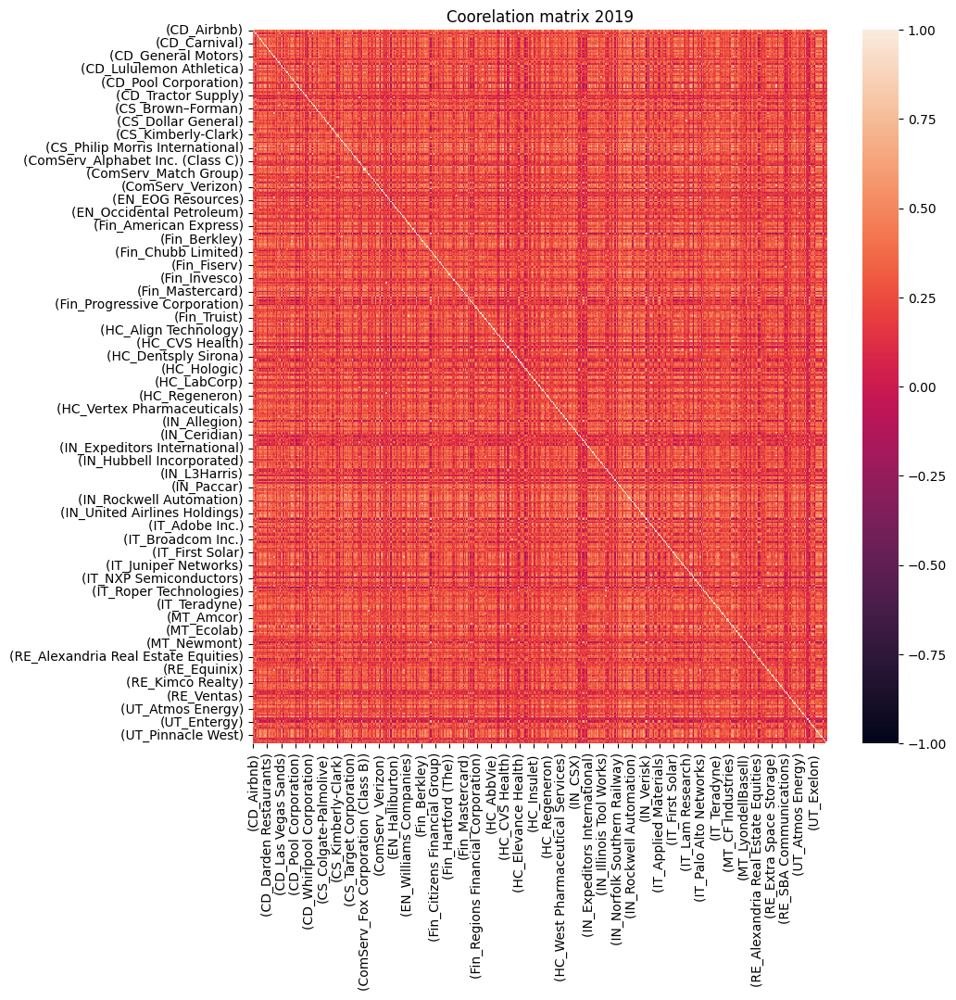

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(10,10))
# Plot the heatmap of the average correlation matrix
sns.heatmap(corr_19, vmin=-1, vmax=1 )
plt.title('Coorelation matrix 2019')
plt.show()

In [ ]:
# Calculate log returns
spnan_20 = pd.read_csv("/content/drive/MyDrive/SNA Project/Filtered_2020.csv")
spnan_20 = spnan_20.set_index('Date')
log_returns = np.log(spnan_20) - np.log(spnan_20.shift(1))
returns_20 = log_returns.iloc[1:]
# Calculate the correlation matrix
corr_20 = returns_20.corr()
# Print the correlation matrix
corr_20

,(CD_Airbnb),(CD_Amazon),(CD_Aptiv),(CD_AutoZone),"(CD_Bath & Body Works, Inc.)",(CD_Best Buy),(CD_Booking Holdings),(CD_BorgWarner),(CD_Caesars Entertainment),(CD_Carnival),...,(UT_NextEra Energy),(UT_NiSource),(UT_PG&E Corporation),(UT_PPL Corporation),(UT_Pinnacle West),(UT_Public Service Enterprise Group),(UT_Sempra Energy),(UT_Southern Company),(UT_WEC Energy Group),(UT_Xcel Energy)
(CD_Airbnb),1.000000,0.777809,0.682013,0.743497,0.630776,0.646848,0.589472,0.707785,0.545272,0.653383,...,0.603667,0.717893,0.637962,0.705038,0.752253,0.674497,0.695777,0.649479,0.637640,0.612246
(CD_Amazon),0.777809,1.000000,0.698131,0.731032,0.629233,0.630772,0.635370,0.712019,0.593762,0.683837,...,0.591909,0.701598,0.637109,0.712040,0.770880,0.689869,0.630969,0.644100,0.619659,0.620390
(CD_Aptiv),0.682013,0.698131,1.000000,0.686394,0.656171,0.634382,0.521442,0.616725,0.534879,0.558259,...,0.509162,0.606532,0.616363,0.633123,0.710544,0.611778,0.729397,0.649724,0.580022,0.625600
(CD_AutoZone),0.743497,0.731032,0.686394,1.000000,0.606305,0.739039,0.666177,0.749379,0.659568,0.736220,...,0.652957,0.820651,0.727313,0.747690,0.926126,0.721559,0.644719,0.682804,0.682767,0.694592
"(CD_Bath & Body Works, Inc.)",0.630776,0.629233,0.656171,0.606305,1.000000,0.524128,0.467080,0.641654,0.362710,0.507504,...,0.506302,0.530715,0.619691,0.492920,0.570681,0.567926,0.695474,0.619900,0.530592,0.473183
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
(UT_Public Service Enterprise Group),0.674497,0.689869,0.611778,0.721559,0.567926,0.635609,0.681587,0.654741,0.547500,0.727130,...,0.548972,0.734555,0.636465,0.694723,0.701707,1.000000,0.557714,0.577969,0.692007,0.548553
(UT_Sempra Energy),0.695777,0.630969,0.729397,0.644719,0.695474,0.513999,0.397380,0.636014,0.328561,0.471509,...,0.516367,0.539682,0.649406,0.522240,0.654337,0.557714,1.000000,0.635334,0.621629,0.491483
(UT_Southern Company),0.649479,0.644100,0.649724,0.682804,0.619900,0.611654,0.531025,0.670457,0.593821,0.582031,...,0.563734,0.649778,0.595764,0.676124,0.665651,0.577969,0.635334,1.000000,0.600659,0.594933
(UT_WEC Energy Group),0.637640,0.619659,0.580022,0.682767,0.530592,0.513265,0.544549,0.637979,0.376278,0.590033,...,0.518325,0.672379,0.600861,0.691626,0.658221,0.692007,0.621629,0.600659,1.000000,0.484913


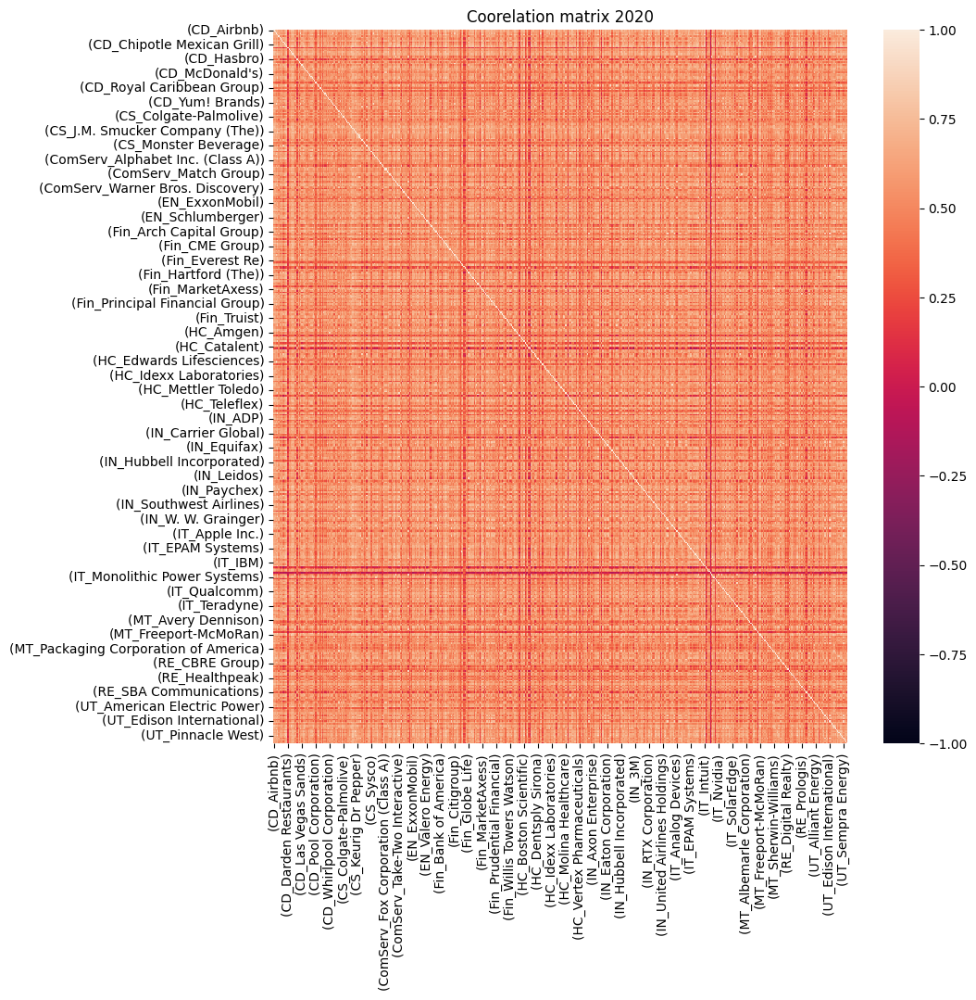

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(10,10))
# Plot the heatmap of the average correlation matrix
sns.heatmap(corr_20, vmin=-1, vmax=1 )
plt.title('Coorelation matrix 2020')
plt.show()

In [ ]:
# Calculate log returns
spnan_21 = pd.read_csv("/content/drive/MyDrive/SNA Project/Filtered_2021.csv")
spnan_21 = spnan_21.set_index('Date')
log_returns = np.log(spnan_21) - np.log(spnan_21.shift(1))
returns_21 = log_returns.iloc[1:]
# Calculate the correlation matrix
corr_21 = returns_21.corr()
# Print the correlation matrix
corr_21

,(CD_Airbnb),(CD_Amazon),(CD_Aptiv),(CD_AutoZone),"(CD_Bath & Body Works, Inc.)",(CD_Best Buy),(CD_Booking Holdings),(CD_BorgWarner),(CD_Caesars Entertainment),(CD_Carnival),...,(UT_NextEra Energy),(UT_NiSource),(UT_PG&E Corporation),(UT_PPL Corporation),(UT_Pinnacle West),(UT_Public Service Enterprise Group),(UT_Sempra Energy),(UT_Southern Company),(UT_WEC Energy Group),(UT_Xcel Energy)
(CD_Airbnb),1.000000,0.371928,0.372440,0.226574,0.370837,0.318631,0.216668,0.347514,0.138053,0.204304,...,0.312206,0.189585,0.206949,0.410015,0.279822,0.330974,0.325927,0.319431,0.329462,0.277473
(CD_Amazon),0.371928,1.000000,0.349569,0.528529,0.353803,0.179019,0.364695,0.246240,0.169154,0.370915,...,0.200491,0.414294,0.490010,0.431501,0.544039,0.435120,0.300353,0.318066,0.451427,0.450818
(CD_Aptiv),0.372440,0.349569,1.000000,0.269946,0.282415,0.329523,0.205948,0.250138,0.233018,0.316925,...,0.218515,0.123050,0.268550,0.249606,0.324862,0.295139,0.408216,0.370569,0.245225,0.335343
(CD_AutoZone),0.226574,0.528529,0.269946,1.000000,0.125678,0.411509,0.446058,0.235256,0.433963,0.546983,...,0.318348,0.541509,0.425413,0.401070,0.859709,0.520036,0.101741,0.297292,0.356305,0.421804
"(CD_Bath & Body Works, Inc.)",0.370837,0.353803,0.282415,0.125678,1.000000,0.209843,0.101443,0.179865,-0.020867,0.051206,...,0.168010,0.110197,0.221274,0.257525,0.193581,0.165535,0.422609,0.434418,0.255316,0.174811
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
(UT_Public Service Enterprise Group),0.330974,0.435120,0.295139,0.520036,0.165535,0.418137,0.395736,0.382647,0.352808,0.469569,...,0.258112,0.397033,0.366862,0.316079,0.570316,1.000000,0.143464,0.323414,0.394256,0.343794
(UT_Sempra Energy),0.325927,0.300353,0.408216,0.101741,0.422609,0.232147,-0.012849,0.119669,-0.037218,0.027405,...,0.074767,0.070809,0.273508,0.315081,0.155641,0.143464,1.000000,0.315195,0.192182,0.258663
(UT_Southern Company),0.319431,0.318066,0.370569,0.297292,0.434418,0.360509,0.284877,0.240886,0.169405,0.322213,...,0.241818,0.243638,0.302200,0.341342,0.338382,0.323414,0.315195,1.000000,0.228137,0.361740
(UT_WEC Energy Group),0.329462,0.451427,0.245225,0.356305,0.255316,0.103651,0.478067,0.274249,0.201835,0.317176,...,0.413961,0.357375,0.395297,0.475718,0.386054,0.394256,0.192182,0.228137,1.000000,0.372765


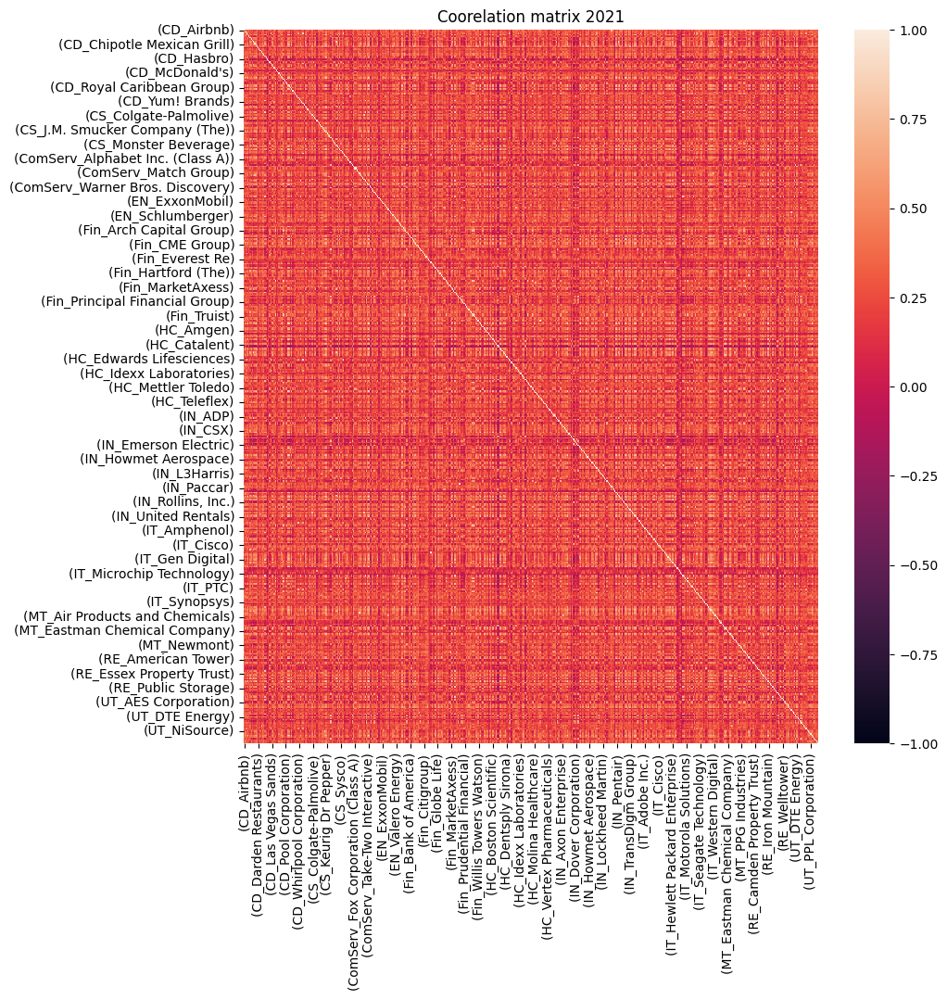

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(10,10))
# Plot the heatmap of the average correlation matrix
sns.heatmap(corr_21, vmin=-1, vmax=1 )
plt.title('Coorelation matrix 2021')
plt.show()

In [ ]:
# Calculate log returns
spnan_22 = pd.read_csv("/content/drive/MyDrive/SNA Project/Filtered_2022.csv")
spnan_22 = spnan_22.set_index('Date')
# Calculate log returns
log_returns = np.log(spnan_22) - np.log(spnan_22.shift(1))
returns_22 = log_returns.iloc[1:]
# Calculate the correlation matrix
corr_22 = returns_22.corr()
# Print the correlation matrix
corr_22

,(CD_Airbnb),(CD_Amazon),(CD_Aptiv),(CD_AutoZone),"(CD_Bath & Body Works, Inc.)",(CD_Best Buy),(CD_Booking Holdings),(CD_BorgWarner),(CD_Caesars Entertainment),(CD_Carnival),...,(UT_NextEra Energy),(UT_NiSource),(UT_PG&E Corporation),(UT_PPL Corporation),(UT_Pinnacle West),(UT_Public Service Enterprise Group),(UT_Sempra Energy),(UT_Southern Company),(UT_WEC Energy Group),(UT_Xcel Energy)
(CD_Airbnb),1.000000,0.425308,0.596656,0.491683,0.547764,0.444256,0.475395,0.571004,0.414690,0.286710,...,0.532394,0.511418,0.466247,0.577415,0.533955,0.509399,0.487246,0.507553,0.511801,0.391042
(CD_Amazon),0.425308,1.000000,0.329148,0.496557,0.336146,0.310744,0.371056,0.367853,0.309878,0.165203,...,0.318706,0.277867,0.420979,0.472346,0.562521,0.307068,0.379739,0.309397,0.384562,0.295759
(CD_Aptiv),0.596656,0.329148,1.000000,0.451166,0.510752,0.379718,0.413548,0.528224,0.362572,0.195797,...,0.439101,0.462492,0.394922,0.530252,0.488174,0.404425,0.601891,0.372778,0.458982,0.403290
(CD_AutoZone),0.491683,0.496557,0.451166,1.000000,0.375901,0.580991,0.641122,0.614524,0.517734,0.206647,...,0.536481,0.472769,0.507402,0.632918,0.821265,0.394452,0.300477,0.389027,0.503689,0.408635
"(CD_Bath & Body Works, Inc.)",0.547764,0.336146,0.510752,0.375901,1.000000,0.385344,0.374344,0.446746,0.316304,0.178116,...,0.377385,0.429567,0.394999,0.492269,0.369254,0.316792,0.502552,0.574646,0.468577,0.392340
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
(UT_Public Service Enterprise Group),0.509399,0.307068,0.404425,0.394452,0.316792,0.431942,0.464932,0.532699,0.409046,0.320669,...,0.416846,0.398476,0.371660,0.440184,0.443740,1.000000,0.293569,0.379977,0.445687,0.303284
(UT_Sempra Energy),0.487246,0.379739,0.601891,0.300477,0.502552,0.184458,0.281896,0.284230,0.166341,0.176325,...,0.208892,0.255127,0.355225,0.348464,0.345228,0.293569,1.000000,0.398133,0.244313,0.282100
(UT_Southern Company),0.507553,0.309397,0.372778,0.389027,0.574646,0.327089,0.355050,0.353517,0.309660,0.183650,...,0.313975,0.308540,0.400930,0.441318,0.394043,0.379977,0.398133,1.000000,0.383734,0.272381
(UT_WEC Energy Group),0.511801,0.384562,0.458982,0.503689,0.468577,0.452705,0.588186,0.621802,0.507389,0.008238,...,0.569283,0.394908,0.411430,0.648933,0.566903,0.445687,0.244313,0.383734,1.000000,0.457928


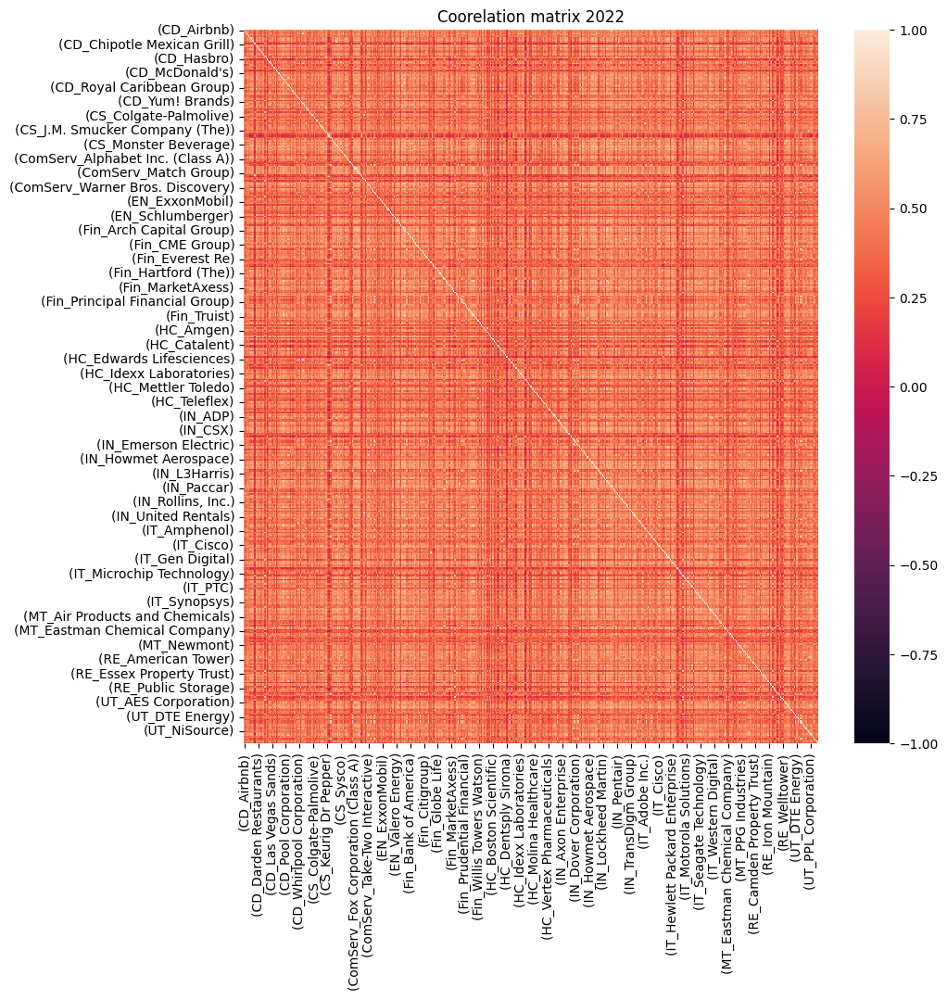

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(10,10))
# Plot the heatmap of the average correlation matrix
sns.heatmap(corr_22, vmin=-1, vmax=1 )
plt.title('Coorelation matrix 2022')
plt.show()

## Network Construction

### Converting Correlation to Distance matrix

In [ ]:
DistMat_19 = np.sqrt(2 * (1 - corr_19))
DistMat_19

,(CD_Airbnb),(CD_Amazon),(CD_Aptiv),(CD_AutoZone),"(CD_Bath & Body Works, Inc.)",(CD_Best Buy),(CD_Booking Holdings),(CD_BorgWarner),(CD_Caesars Entertainment),(CD_Carnival),...,(UT_NextEra Energy),(UT_NiSource),(UT_PG&E Corporation),(UT_PPL Corporation),(UT_Pinnacle West),(UT_Public Service Enterprise Group),(UT_Sempra Energy),(UT_Southern Company),(UT_WEC Energy Group),(UT_Xcel Energy)
(CD_Airbnb),0.000000,0.996134,1.156388,1.114162,1.089492,1.134353,1.188369,1.130860,1.229121,1.161859,...,1.138730,1.149179,1.172885,1.102338,1.106809,1.181376,1.267673,1.268180,1.236198,1.189621
(CD_Amazon),0.996134,0.000000,1.230746,1.074002,1.129394,1.209199,1.126213,1.153446,1.143655,1.233063,...,1.181716,1.161941,1.212677,1.112691,1.013127,1.116995,1.303077,1.291028,1.173476,1.310131
(CD_Aptiv),1.156388,1.230746,0.000000,1.363945,1.200452,1.323038,1.411086,1.274798,1.440360,1.432628,...,1.407508,1.373819,1.288079,1.304208,1.363589,1.360461,1.074012,1.299352,1.323655,1.269716
(CD_AutoZone),1.114162,1.074002,1.363945,0.000000,1.260275,1.116464,0.903309,1.090055,1.061870,1.109772,...,1.073037,0.893540,1.026939,0.963768,0.579273,0.865013,1.475553,1.278053,1.030068,1.215272
"(CD_Bath & Body Works, Inc.)",1.089492,1.129394,1.200452,1.260275,0.000000,1.192008,1.241451,1.210595,1.265642,1.238740,...,1.234346,1.231097,1.190253,1.196897,1.209946,1.235132,1.227859,1.126779,1.271286,1.238508
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
(UT_Public Service Enterprise Group),1.181376,1.116995,1.360461,0.865013,1.235132,1.105530,0.867394,1.136476,1.063553,1.049966,...,0.987407,0.907771,0.973616,1.040548,0.893675,0.000000,1.469394,1.248499,1.003172,1.271980
(UT_Sempra Energy),1.267673,1.303077,1.074012,1.475553,1.227859,1.334463,1.502140,1.392597,1.440485,1.347873,...,1.450190,1.457158,1.375903,1.394241,1.430525,1.469394,0.000000,1.342265,1.443227,1.317868
(UT_Southern Company),1.268180,1.291028,1.299352,1.278053,1.126779,1.182829,1.305160,1.231093,1.307876,1.285020,...,1.361197,1.289301,1.228377,1.260604,1.290105,1.248499,1.342265,0.000000,1.262813,1.278725
(UT_WEC Energy Group),1.236198,1.173476,1.323655,1.030068,1.271286,1.159308,1.042607,1.124383,1.200589,1.143046,...,1.127333,1.032284,1.056207,1.041586,1.104939,1.003172,1.443227,1.262813,0.000000,1.262642


In [ ]:
DistMat_20 = np.sqrt(2 * (1 - corr_20))
DistMat_20

,(CD_Airbnb),(CD_Amazon),(CD_Aptiv),(CD_AutoZone),"(CD_Bath & Body Works, Inc.)",(CD_Best Buy),(CD_Booking Holdings),(CD_BorgWarner),(CD_Caesars Entertainment),(CD_Carnival),...,(UT_NextEra Energy),(UT_NiSource),(UT_PG&E Corporation),(UT_PPL Corporation),(UT_Pinnacle West),(UT_Public Service Enterprise Group),(UT_Sempra Energy),(UT_Southern Company),(UT_WEC Energy Group),(UT_Xcel Energy)
(CD_Airbnb),0.000000,0.666620,0.797480,0.716244,0.859330,0.840419,0.906122,0.764480,0.953654,0.832607,...,0.890318,0.751142,0.850927,0.768065,0.703913,0.806849,0.780030,0.837283,0.851305,0.880629
(CD_Amazon),0.666620,0.000000,0.777006,0.733441,0.861124,0.859335,0.853967,0.758922,0.901374,0.795190,...,0.903428,0.772530,0.851929,0.758894,0.676934,0.787567,0.859105,0.843682,0.872171,0.871332
(CD_Aptiv),0.797480,0.777006,0.000000,0.791968,0.829252,0.855123,0.978323,0.875528,0.964490,0.939937,...,0.990795,0.887094,0.875942,0.856595,0.760862,0.881161,0.735667,0.836990,0.916491,0.865332
(CD_AutoZone),0.716244,0.733441,0.791968,0.000000,0.887350,0.722442,0.817097,0.707984,0.825145,0.726334,...,0.833119,0.598914,0.738495,0.710366,0.384379,0.746246,0.842948,0.796488,0.796534,0.781548
"(CD_Bath & Body Works, Inc.)",0.859330,0.861124,0.829252,0.887350,0.000000,0.975574,1.032395,0.846576,1.128973,0.992468,...,0.993678,0.968798,0.872134,1.007055,0.926628,0.929596,0.780418,0.871895,0.968925,1.026467
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
(UT_Public Service Enterprise Group),0.806849,0.787567,0.881161,0.746246,0.929596,0.853687,0.798013,0.830974,0.951314,0.738742,...,0.949766,0.728623,0.852683,0.781380,0.772390,0.000000,0.940517,0.918729,0.784848,0.950207
(UT_Sempra Energy),0.780030,0.859105,0.735667,0.842948,0.780418,0.985902,1.097834,0.853213,1.158826,1.028096,...,0.983497,0.959498,0.837370,0.977507,0.831460,0.940517,0.000000,0.854009,0.869909,1.008481
(UT_Southern Company),0.837283,0.843682,0.836990,0.796488,0.871895,0.881302,0.968478,0.811841,0.901309,0.914296,...,0.934094,0.836925,0.899151,0.804830,0.817739,0.918729,0.854009,0.000000,0.893690,0.900074
(UT_WEC Energy Group),0.851305,0.872171,0.916491,0.796534,0.968925,0.986646,0.954411,0.850907,1.116890,0.905502,...,0.981504,0.809471,0.893464,0.785333,0.826775,0.784848,0.869909,0.893690,0.000000,1.014974


In [ ]:
DistMat_21 = np.sqrt(2 * (1 - corr_21))
DistMat_21

,(CD_Airbnb),(CD_Amazon),(CD_Aptiv),(CD_AutoZone),"(CD_Bath & Body Works, Inc.)",(CD_Best Buy),(CD_Booking Holdings),(CD_BorgWarner),(CD_Caesars Entertainment),(CD_Carnival),...,(UT_NextEra Energy),(UT_NiSource),(UT_PG&E Corporation),(UT_PPL Corporation),(UT_Pinnacle West),(UT_Public Service Enterprise Group),(UT_Sempra Energy),(UT_Southern Company),(UT_WEC Energy Group),(UT_Xcel Energy)
(CD_Airbnb),0.000000,1.120779,1.120321,1.243725,1.121752,1.167364,1.251664,1.142353,1.312972,1.261504,...,1.172855,1.273119,1.259405,1.086264,1.200148,1.156742,1.161097,1.166678,1.158048,1.202104
(CD_Amazon),1.120779,0.000000,1.140553,0.971052,1.136835,1.281391,1.127213,1.227811,1.289067,1.121682,...,1.264523,1.082318,1.009941,1.066301,0.954947,1.062902,1.182917,1.167847,1.047447,1.048028
(CD_Aptiv),1.120321,1.140553,0.000000,1.208349,1.197985,1.157996,1.260200,1.224632,1.238533,1.168824,...,1.250188,1.324349,1.209504,1.225067,1.162014,1.187318,1.087920,1.121990,1.228637,1.152959
(CD_AutoZone),1.243725,0.971052,1.208349,0.000000,1.322363,1.084888,1.052561,1.236725,1.063990,0.951858,...,1.167606,0.957592,1.071996,1.094468,0.529699,0.979759,1.340343,1.185502,1.134632,1.075356
"(CD_Bath & Body Works, Inc.)",1.121752,1.136835,1.197985,1.322363,0.000000,1.257106,1.340564,1.280730,1.428893,1.377529,...,1.289954,1.334018,1.247979,1.218585,1.269975,1.291871,1.074608,1.063562,1.220397,1.284671
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
(UT_Public Service Enterprise Group),1.156742,1.062902,1.187318,0.979759,1.291871,1.078761,1.099331,1.111174,1.137710,1.029982,...,1.218104,1.098151,1.125289,1.169548,0.927021,0.000000,1.308844,1.163259,1.100676,1.145606
(UT_Sempra Energy),1.161097,1.182917,1.087920,1.340343,1.074608,1.239236,1.423270,1.326899,1.440290,1.394700,...,1.360319,1.363225,1.205398,1.170401,1.299507,1.308844,0.000000,1.170303,1.271077,1.217651
(UT_Southern Company),1.166678,1.167847,1.121990,1.185502,1.063562,1.130921,1.195929,1.232164,1.288871,1.164291,...,1.231408,1.229929,1.181355,1.147744,1.150320,1.163259,1.170303,0.000000,1.242468,1.129832
(UT_WEC Energy Group),1.158048,1.047447,1.228637,1.134632,1.220397,1.338917,1.021698,1.204783,1.263459,1.168609,...,1.082625,1.133689,1.099730,1.023994,1.108103,1.100676,1.271077,1.242468,0.000000,1.120031


In [ ]:
DistMat_22 = np.sqrt(2 * (1 - corr_22))
DistMat_22

,(CD_Airbnb),(CD_Amazon),(CD_Aptiv),(CD_AutoZone),"(CD_Bath & Body Works, Inc.)",(CD_Best Buy),(CD_Booking Holdings),(CD_BorgWarner),(CD_Caesars Entertainment),(CD_Carnival),...,(UT_NextEra Energy),(UT_NiSource),(UT_PG&E Corporation),(UT_PPL Corporation),(UT_Pinnacle West),(UT_Public Service Enterprise Group),(UT_Sempra Energy),(UT_Southern Company),(UT_WEC Energy Group),(UT_Xcel Energy)
(CD_Airbnb),0.000000,1.072093,0.898158,1.008283,0.951038,1.054271,1.024309,0.926279,1.081952,1.194396,...,0.967063,0.988517,1.033201,0.919331,0.965448,0.990556,1.012674,0.992418,0.988128,1.103592
(CD_Amazon),1.072093,0.000000,1.158320,1.003437,1.152262,1.174101,1.121556,1.124408,1.174838,1.292128,...,1.167300,1.201776,1.076124,1.027282,0.935392,1.177228,1.113787,1.175247,1.109449,1.186795
(CD_Aptiv),0.898158,1.158320,0.000000,1.047696,0.989190,1.113806,1.083007,0.971366,1.129095,1.268230,...,1.059150,1.036829,1.100071,0.969276,1.011757,1.091398,0.892310,1.120020,1.040210,1.092438
(CD_AutoZone),1.008283,1.003437,1.047696,0.000000,1.117228,0.915433,0.847205,0.878038,0.982106,1.259645,...,0.962828,1.026870,0.992570,0.856833,0.597888,1.100498,1.182813,1.105416,0.996304,1.087534
"(CD_Bath & Body Works, Inc.)",0.951038,1.152262,0.989190,1.117228,0.000000,1.108743,1.118621,1.051907,1.169355,1.282095,...,1.115899,1.068114,1.100001,1.007701,1.123161,1.168938,0.997445,0.922338,1.030945,1.102416
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
(UT_Public Service Enterprise Group),0.990556,1.177228,1.091398,1.100498,1.168938,1.065887,1.034474,0.966748,1.087156,1.165616,...,1.079957,1.096835,1.121017,1.058127,1.054760,0.000000,1.188638,1.113573,1.052913,1.180437
(UT_Sempra Energy),1.012674,1.113787,0.892310,1.182813,0.997445,1.277139,1.198419,1.196470,1.291247,1.283491,...,1.257862,1.220551,1.135583,1.141522,1.144353,1.188638,0.000000,1.097148,1.229379,1.198249
(UT_Southern Company),0.992418,1.175247,1.120020,1.105416,0.922338,1.160096,1.135738,1.137087,1.175024,1.277771,...,1.171345,1.175976,1.094596,1.057054,1.100870,1.113573,1.097148,0.000000,1.110194,1.206332
(UT_WEC Energy Group),0.988128,1.109449,1.040210,0.996304,1.030945,1.046227,0.907540,0.869710,0.992584,1.408377,...,0.928135,1.100084,1.084961,0.837935,0.930695,1.052913,1.229379,1.110194,0.000000,1.041223


In [ ]:
DistMat_22.to_csv("distmat.csv")

### Minimum Spanning Tree

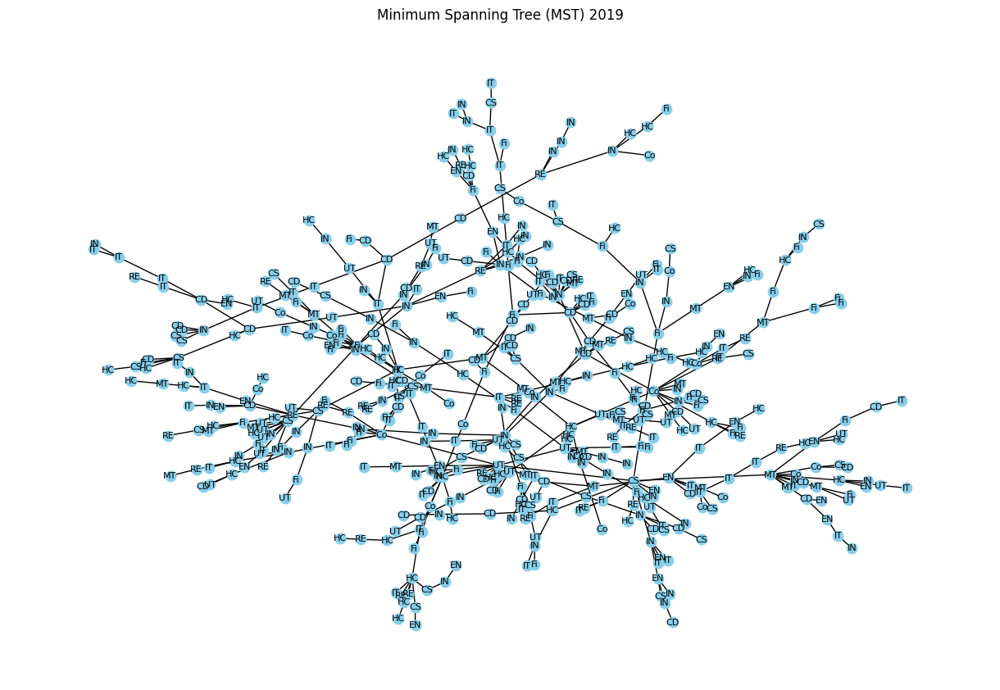

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np

# Extract the node names (company names) from the columns of your distance matrix for 2019
node_names_19 = [name.split('_')[0].strip('()')[:2] for name in DistMat_19.columns]

# Create node_labels dictionary for 2019
node_labels_19 = {i: node_names_19[i] for i in range(len(node_names_19))}

# Create a NetworkX graph from the distance matrix for 2019
G_19 = nx.from_numpy_array(np.array(DistMat_19))

# Calculate the minimum spanning tree for 2019 using NetworkX
mst_19 = nx.minimum_spanning_tree(G_19)

# Visualize the MST with labeled nodes for 2019
plt.figure(figsize=(12, 8))
pos_19 = nx.spring_layout(mst_19)  # Positions nodes for visualization
nx.draw(mst_19, pos_19, labels=node_labels_19, with_labels=True, node_color='skyblue', node_size=80, font_size=8, edge_color='black')
plt.title('Minimum Spanning Tree (MST) 2019')
plt.show()


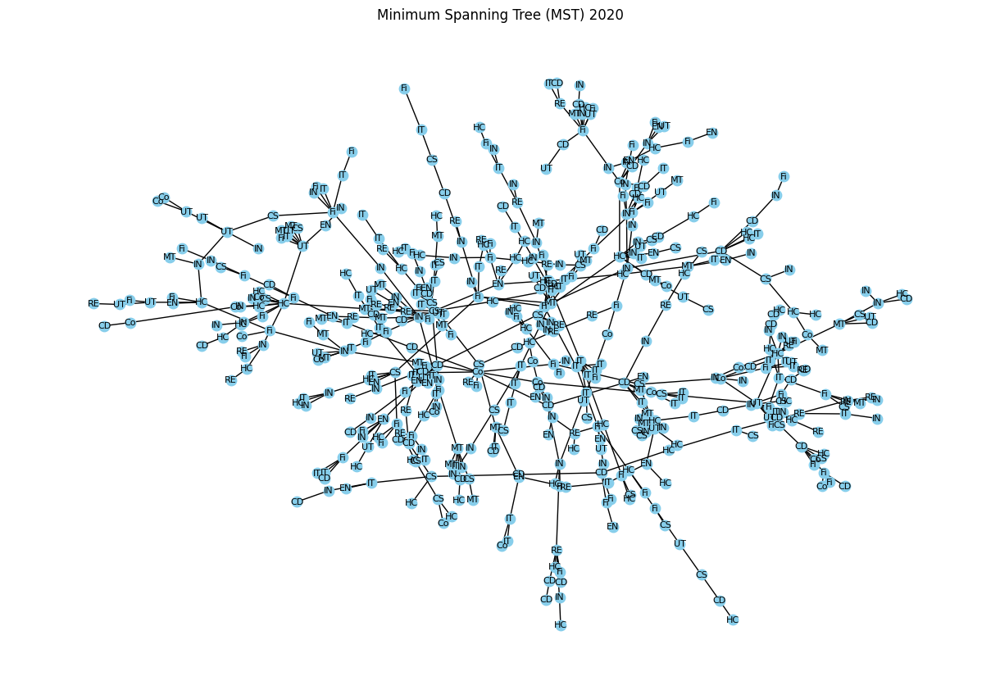

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np

# Extract the first two characters from each column name, ignoring brackets
node_names_20 = [name.split('_')[0].strip('()')[:2] for name in DistMat_20.columns]
# Create node_labels dictionary for 2020
node_labels_20 = {i: node_names_20[i] for i in range(len(node_names_20))}

# Create a NetworkX graph from the distance matrix for 2020
G_20 = nx.from_numpy_array(np.array(DistMat_20))

# Calculate the minimum spanning tree for 2020 using NetworkX
mst_20 = nx.minimum_spanning_tree(G_20)

# Visualize the MST with labeled nodes for 2020
plt.figure(figsize=(12, 8))
pos_20 = nx.spring_layout(mst_20)  # Positions nodes for visualization
nx.draw(mst_20, pos_20, labels=node_labels_20, with_labels=True, node_color='skyblue', node_size=80, font_size=8, edge_color='black')
plt.title('Minimum Spanning Tree (MST) 2020')
plt.show()

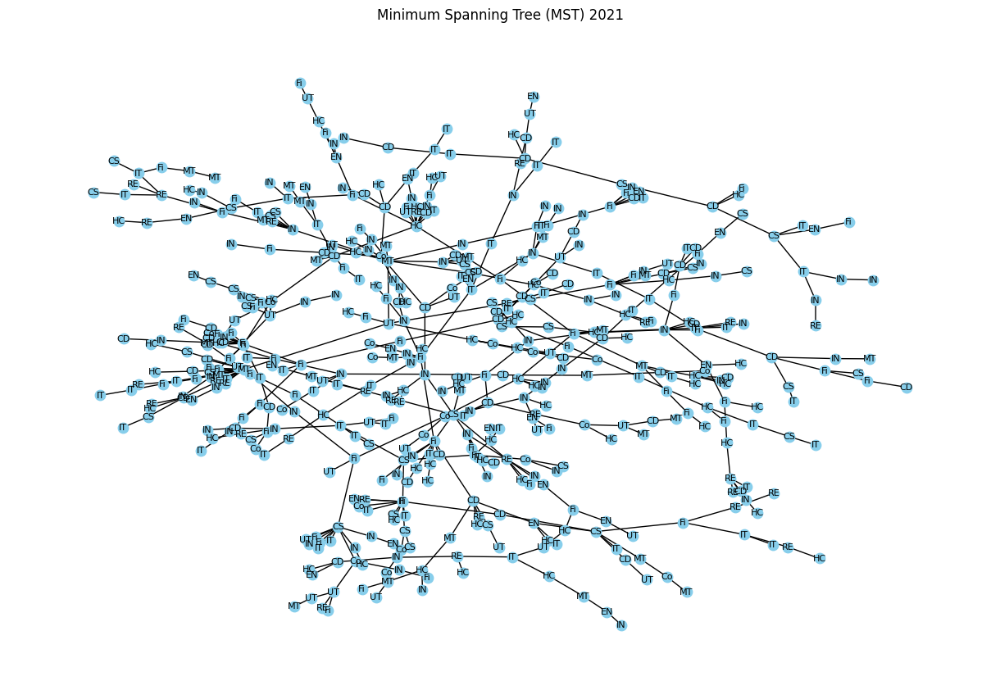

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np

# Extract the first two characters from each column name, ignoring brackets
node_names_21 = [name.split('_')[0].strip('()')[:2] for name in DistMat_21.columns]
# Create node_labels dictionary for 2021
node_labels_21 = {i: node_names_21[i] for i in range(len(node_names_21))}

# Create a NetworkX graph from the distance matrix for 2021
G_21 = nx.from_numpy_array(np.array(DistMat_21))

# Calculate the minimum spanning tree for 2021 using NetworkX
mst_21 = nx.minimum_spanning_tree(G_21)

# Visualize the MST with labeled nodes for 2021
plt.figure(figsize=(12, 8))
pos_21 = nx.spring_layout(mst_21)  # Positions nodes for visualization
nx.draw(mst_21, pos_21, labels=node_labels_21, with_labels=True, node_color='skyblue', node_size=80, font_size=8, edge_color='black')
plt.title('Minimum Spanning Tree (MST) 2021')
plt.show()


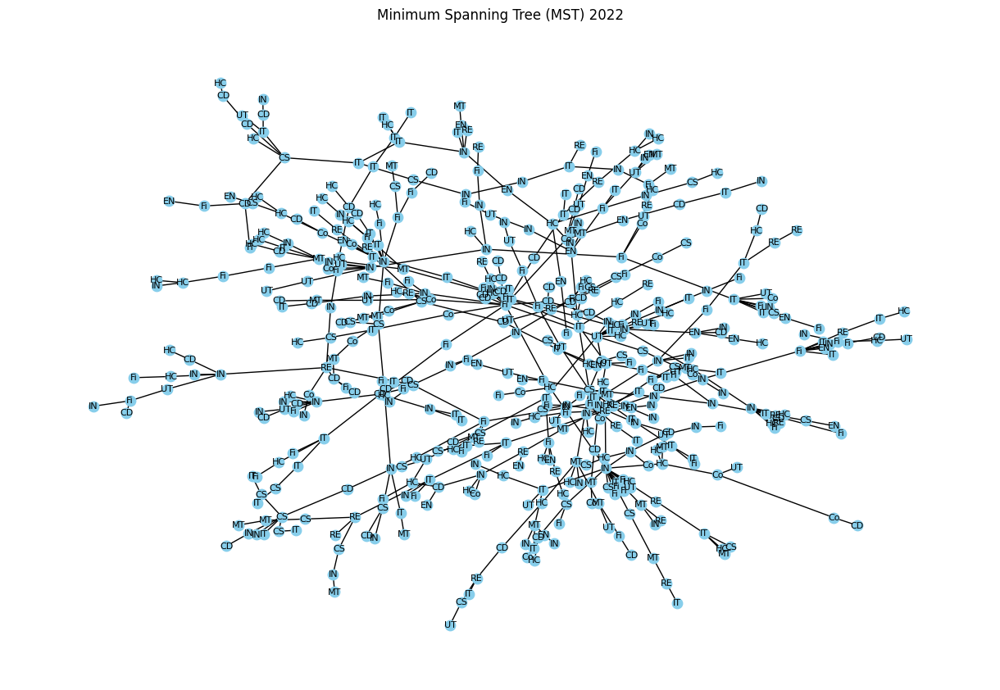

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np

# Extract the first two characters from each column name, ignoring brackets
node_names_22 = [name.split('_')[0].strip('()')[:2] for name in DistMat_22.columns]
# Create node_labels dictionary for 2022
node_labels_22 = {i: node_names_22[i] for i in range(len(node_names_22))}

# Create a NetworkX graph from the distance matrix for 2022
G_22 = nx.from_numpy_array(np.array(DistMat_22))

# Calculate the minimum spanning tree for 2022 using NetworkX
mst_22 = nx.minimum_spanning_tree(G_22)

# Visualize the MST with labeled nodes for 2022
plt.figure(figsize=(12, 8))
pos_22 = nx.spring_layout(mst_22)  # Positions nodes for visualization
nx.draw(mst_22, pos_22, labels=node_labels_22, with_labels=True, node_color='skyblue', node_size=80, font_size=8, edge_color='black')
plt.title('Minimum Spanning Tree (MST) 2022')
plt.show()

## Centrality Measures based on years

### Degree Centrality

In [ ]:
# Calculate degree centrality
degree_centrality = nx.degree_centrality(mst_19)

node_labels = {i: DistMat_19.columns[i] for i in range(len(DistMat_19.columns))}

# Assuming 'node_names' contains the names of companies corresponding to the nodes in your MST
node_mapping = {i: node_labels[i] for i in range(len(node_labels))}

# Create a DataFrame with node names and their degree centrality values
degree_19 = pd.DataFrame({
    'Node': [node_mapping[i] for i in range(len(node_mapping))],
    'Degree Centrality': [degree_centrality[i] for i in range(len(degree_centrality))]
})

# Sort the DataFrame by degree centrality values (optional)
degree_19 = degree_19.sort_values(by='Degree Centrality', ascending=False)

# Display the DataFrame with node names and their degree centrality values
degree_19


,Node,Degree Centrality
473,(UT_DTE Energy),0.024440
80,(CS_PepsiCo),0.022403
411,(MT_Dow Inc.),0.022403
74,(CS_Kroger),0.020367
152,(Fin_Charles Schwab Corporation),0.020367
...,...,...
211,(HC_Bio-Rad),0.002037
210,(HC_Becton Dickinson),0.002037
209,(HC_Baxter International),0.002037
208,(HC_Amgen),0.002037


In [ ]:
# Calculate degree centrality
degree_centrality = nx.degree_centrality(mst_20)

node_labels = {i: DistMat_20.columns[i] for i in range(len(DistMat_20.columns))}

# Assuming 'node_names' contains the names of companies corresponding to the nodes in your MST
node_mapping = {i: node_labels[i] for i in range(len(node_labels))}

# Create a DataFrame with node names and their degree centrality values
degree_20 = pd.DataFrame({
    'Node': [node_mapping[i] for i in range(len(node_mapping))],
    'Degree Centrality': [degree_centrality[i] for i in range(len(degree_centrality))]
})

# Sort the DataFrame by degree centrality values
degree_20 = degree_20.sort_values(by='Degree Centrality', ascending=False)

# Display the DataFrame with node names and their degree centrality values
degree_20


,Node,Degree Centrality
11,(CD_D.R. Horton),0.032323
251,(HC_Moderna),0.022222
262,(HC_UnitedHealth Group),0.020202
219,(HC_Cardinal Health),0.020202
470,(UT_American Electric Power),0.020202
...,...,...
210,(HC_Amgen),0.002020
209,(HC_Align Technology),0.002020
207,(HC_Abbott),0.002020
206,(HC_AbbVie),0.002020


In [ ]:
# Calculate degree centrality
degree_centrality = nx.degree_centrality(mst_21)

node_labels = {i: DistMat_21.columns[i] for i in range(len(DistMat_21.columns))}

# Assuming 'node_names' contains the names of companies corresponding to the nodes in your MST
node_mapping = {i: node_labels[i] for i in range(len(node_labels))}

# Create a DataFrame with node names and their degree centrality values
degree_21 = pd.DataFrame({
    'Node': [node_mapping[i] for i in range(len(node_mapping))],
    'Degree Centrality': [degree_centrality[i] for i in range(len(degree_centrality))]
})

# Sort the DataFrame by degree centrality values (optional)
degree_21 = degree_21.sort_values(by='Degree Centrality', ascending=False)

# Display the DataFrame with node names and their degree centrality values
degree_21


,Node,Degree Centrality
430,(MT_Newmont),0.026104
242,(HC_Incyte),0.024096
139,(Fin_Aon),0.022088
75,(CS_Kroger),0.020080
137,(Fin_American International Group),0.018072
...,...,...
118,(EN_EOG Resources),0.002008
117,(EN_Diamondback Energy),0.002008
314,(IN_Masco),0.002008
315,(IN_Nordson Corporation),0.002008


In [ ]:
# Calculate degree centrality
degree_centrality = nx.degree_centrality(mst_22)

node_labels = {i: DistMat_22.columns[i] for i in range(len(DistMat_22.columns))}

# Assuming 'node_names' contains the names of companies corresponding to the nodes in your MST
node_mapping = {i: node_labels[i] for i in range(len(node_labels))}

# Create a DataFrame with node names and their degree centrality values
degree_22 = pd.DataFrame({
    'Node': [node_mapping[i] for i in range(len(node_mapping))],
    'Degree Centrality': [degree_centrality[i] for i in range(len(degree_centrality))]
})

# Sort the DataFrame by degree centrality values (optional)
degree_22 = degree_22.sort_values(by='Degree Centrality', ascending=False)

# Display the DataFrame with node names and their degree centrality values
degree_22


,Node,Degree Centrality
275,(IN_Ametek),0.034137
139,(Fin_Aon),0.032129
81,(CS_PepsiCo),0.030120
473,(UT_American Electric Power),0.024096
27,(CD_Lululemon Athletica),0.018072
...,...,...
216,(HC_Boston Scientific),0.002008
215,(HC_Biogen),0.002008
213,(HC_Bio-Rad),0.002008
212,(HC_Becton Dickinson),0.002008


### EigenVector Centrality

In [ ]:
# Calculate eigenvector centrality
eigenvector_centrality = nx.eigenvector_centrality(mst_19, max_iter=500, tol=1e-6 )

node_labels = {i: DistMat_19.columns[i] for i in range(len(DistMat_19.columns))}

# Assuming 'node_names' contains the names of companies corresponding to the nodes in your MST
node_mapping = {i: node_labels[i] for i in range(len(node_labels))}

# Create a DataFrame with node names and their degree centrality values
eigen_19 = pd.DataFrame({
    'Node': [node_mapping[i] for i in range(len(node_mapping))],
    'eigenvector_centrality': [eigenvector_centrality[i] for i in range(len(eigenvector_centrality))]
})

# Sort the DataFrame by degree centrality values (optional)
eigen_19 = eigen_19.sort_values(by='eigenvector_centrality', ascending=False)

# Display the DataFrame with node names and their degree centrality values
eigen_19


,Node,eigenvector_centrality
473,(UT_DTE Energy),4.910078e-01
80,(CS_PepsiCo),4.234080e-01
411,(MT_Dow Inc.),2.722524e-01
466,(UT_American Electric Power),2.275987e-01
212,(HC_Bio-Techne),2.078893e-01
...,...,...
373,(IT_Microchip Technology),4.727989e-08
246,(HC_Merck & Co.),4.727989e-08
219,(HC_Cencora),1.410786e-08
369,(IT_Juniper Networks),1.353116e-08


In [ ]:
# Calculate eigenvector centrality
eigenvector_centrality = nx.eigenvector_centrality(mst_20, max_iter=500, tol=1e-6 )

node_labels = {i: DistMat_20.columns[i] for i in range(len(DistMat_20.columns))}

# Assuming 'node_names' contains the names of companies corresponding to the nodes in your MST
node_mapping = {i: node_labels[i] for i in range(len(node_labels))}

# Create a DataFrame with node names and their degree centrality values
eigen_20 = pd.DataFrame({
    'Node': [node_mapping[i] for i in range(len(node_mapping))],
    'eigenvector_centrality': [eigenvector_centrality[i] for i in range(len(eigenvector_centrality))]
})

# Sort the DataFrame by degree centrality values (optional)
eigen_20 = eigen_20.sort_values(by='eigenvector_centrality', ascending=False)

# Display the DataFrame with node names and their degree centrality values
eigen_20


,Node,eigenvector_centrality
11,(CD_D.R. Horton),6.440499e-01
67,(CS_General Mills),2.490950e-01
81,(CS_PepsiCo),2.282572e-01
307,(IN_John Deere),2.112817e-01
125,(EN_Marathon Petroleum),1.969335e-01
...,...,...
285,(IN_Cummins),1.371529e-10
466,(RE_Weyerhaeuser),1.371529e-10
328,"(IN_Rollins, Inc.)",1.287959e-10
249,(HC_Merck & Co.),1.246701e-10


In [ ]:
# Calculate eigenvector centrality
eigenvector_centrality = nx.eigenvector_centrality(mst_21, max_iter=500, tol=1e-6 )

node_labels = {i: DistMat_21.columns[i] for i in range(len(DistMat_21.columns))}

# Assuming 'node_names' contains the names of companies corresponding to the nodes in your MST
node_mapping = {i: node_labels[i] for i in range(len(node_labels))}

# Create a DataFrame with node names and their degree centrality values
eigen_21 = pd.DataFrame({
    'Node': [node_mapping[i] for i in range(len(node_mapping))],
    'eigenvector_centrality': [eigenvector_centrality[i] for i in range(len(eigenvector_centrality))]
})

# Sort the DataFrame by degree centrality values (optional)
eigen_21 = eigen_21.sort_values(by='eigenvector_centrality', ascending=False)

# Display the DataFrame with node names and their degree centrality values
eigen_21


,Node,eigenvector_centrality
430,(MT_Newmont),6.213293e-01
470,(UT_AES Corporation),3.007995e-01
434,(MT_Sealed Air),2.320656e-01
22,(CD_Home Depot (The)),2.070501e-01
389,(IT_Oracle Corporation),1.903896e-01
...,...,...
440,(RE_American Tower),9.548009e-11
289,(IN_Eaton Corporation),9.548009e-11
15,(CD_Expedia Group),5.459605e-11
424,(MT_International Flavors & Fragrances),5.050824e-11


In [ ]:
# Calculate eigenvector centrality
eigenvector_centrality = nx.eigenvector_centrality(mst_22, max_iter=500, tol=1e-6 )

node_labels = {i: DistMat_22.columns[i] for i in range(len(DistMat_22.columns))}

# Assuming 'node_names' contains the names of companies corresponding to the nodes in your MST
node_mapping = {i: node_labels[i] for i in range(len(node_labels))}

# Create a DataFrame with node names and their degree centrality values
eigen_22 = pd.DataFrame({
    'Node': [node_mapping[i] for i in range(len(node_mapping))],
    'eigenvector_centrality': [eigenvector_centrality[i] for i in range(len(eigenvector_centrality))]
})

# Sort the DataFrame by degree centrality values (optional)
eigen_22 = eigen_22.sort_values(by='eigenvector_centrality', ascending=False)

# Display the DataFrame with node names and their degree centrality values
eigen_22


,Node,eigenvector_centrality
275,(IN_Ametek),4.670875e-01
139,(Fin_Aon),4.367886e-01
473,(UT_American Electric Power),2.449242e-01
239,(HC_IQVIA),2.148045e-01
458,(RE_Mid-America Apartment Communities),1.883819e-01
...,...,...
481,(UT_Dominion Energy),5.915059e-13
186,"(Fin_Nasdaq, Inc.)",4.895977e-13
258,(HC_Steris),4.051777e-13
479,(UT_Constellation Energy),1.403000e-13


### Betwenness Centrality

In [ ]:
# Calculate eigenvector centrality
bc = nx.betweenness_centrality(mst_19)

labels_19 = {i: DistMat_19.columns[i] for i in range(len(DistMat_19.columns))}

# Assuming 'node_names' contains the names of companies corresponding to the nodes in your MST
mapping_19= {i: labels_19[i] for i in range(len(labels_19))}

# Create a DataFrame with node names and their degree centrality values
btw_19 = pd.DataFrame({
    'Node': [mapping_19[i] for i in range(len(mapping_19))],
    'betweenness_centrality': [bc[i] for i in range(len(bc))]
})

# Sort the DataFrame by degree centrality values (optional)
btw_19 = btw_19.sort_values(by='betweenness_centrality', ascending=False)

# Display the DataFrame with node names and their degree centrality values
btw_19


,Node,betweenness_centrality
248,(HC_Moderna),0.623509
214,(HC_Boston Scientific),0.573341
212,(HC_Bio-Techne),0.543231
410,(MT_Corteva),0.513055
88,(ComServ_AT&T),0.501002
...,...,...
211,(HC_Bio-Rad),0.000000
210,(HC_Becton Dickinson),0.000000
209,(HC_Baxter International),0.000000
208,(HC_Amgen),0.000000


In [ ]:
# Calculate eigenvector centrality
bc = nx.betweenness_centrality(mst_20)

labels_20 = {i: DistMat_20.columns[i] for i in range(len(DistMat_20.columns))}

# Assuming 'node_names' contains the names of companies corresponding to the nodes in your MST
mapping_20 = {i: labels_20[i] for i in range(len(labels_20))}

# Create a DataFrame with node names and their degree centrality values
btw_20 = pd.DataFrame({
    'Node': [mapping_20[i] for i in range(len(mapping_20))],
    'betweenness_centrality': [bc[i] for i in range(len(bc))]
})

# Sort the DataFrame by degree centrality values (optional)
btw_20 = btw_20.sort_values(by='betweenness_centrality', ascending=False)

# Display the DataFrame with node names and their degree centrality values
btw_20


,Node,betweenness_centrality
11,(CD_D.R. Horton),0.640682
470,(UT_American Electric Power),0.588230
68,(CS_Hershey's),0.513082
59,(CS_Coca-Cola Company (The)),0.504584
104,(ComServ_News Corp (Class B)),0.504143
...,...,...
210,(HC_Amgen),0.000000
209,(HC_Align Technology),0.000000
207,(HC_Abbott),0.000000
206,(HC_AbbVie),0.000000


In [ ]:
# Calculate eigenvector centrality
bc = nx.betweenness_centrality(mst_21)

labels_21 = {i: DistMat_21.columns[i] for i in range(len(DistMat_21.columns))}

# Assuming 'node_names' contains the names of companies corresponding to the nodes in your MST
mapping_21 = {i: labels_21[i] for i in range(len(labels_21))}

# Create a DataFrame with node names and their degree centrality values
btw_21 = pd.DataFrame({
    'Node': [mapping_21[i] for i in range(len(mapping_21))],
    'betweenness_centrality': [bc[i] for i in range(len(bc))]
})

# Sort the DataFrame by degree centrality values (optional)
btw_21 = btw_21.sort_values(by='betweenness_centrality', ascending=False)

# Display the DataFrame with node names and their degree centrality values
btw_21


,Node,betweenness_centrality
95,(ComServ_Electronic Arts),0.636469
281,(IN_Carrier Global),0.543074
455,(RE_Invitation Homes),0.516157
180,(Fin_MarketAxess),0.506598
339,(IN_United Parcel Service),0.505935
...,...,...
271,(IN_A. O. Smith),0.000000
270,(IN_ADP),0.000000
269,(HC_Zoetis),0.000000
268,(HC_Zimmer Biomet),0.000000


In [ ]:
# Calculate eigenvector centrality
bc = nx.betweenness_centrality(mst_22)

labels_22 = {i: DistMat_22.columns[i] for i in range(len(DistMat_22.columns))}

# Assuming 'node_names' contains the names of companies corresponding to the nodes in your MST
mapping_22= {i: labels_22[i] for i in range(len(labels_22))}

# Create a DataFrame with node names and their degree centrality values
btw_22 = pd.DataFrame({
    'Node': [mapping_22[i] for i in range(len(mapping_22))],
    'betweenness_centrality': [bc[i] for i in range(len(bc))]
})

# Sort the DataFrame by degree centrality values (optional)
btw_22 = btw_22.sort_values(by='betweenness_centrality', ascending=False)

# Display the DataFrame with node names and their degree centrality values
btw_22


,Node,betweenness_centrality
81,(CS_PepsiCo),0.684864
139,(Fin_Aon),0.610935
473,(UT_American Electric Power),0.572212
95,(ComServ_Electronic Arts),0.503010
275,(IN_Ametek),0.332962
...,...,...
216,(HC_Boston Scientific),0.000000
215,(HC_Biogen),0.000000
213,(HC_Bio-Rad),0.000000
212,(HC_Becton Dickinson),0.000000


### Centrality Plots

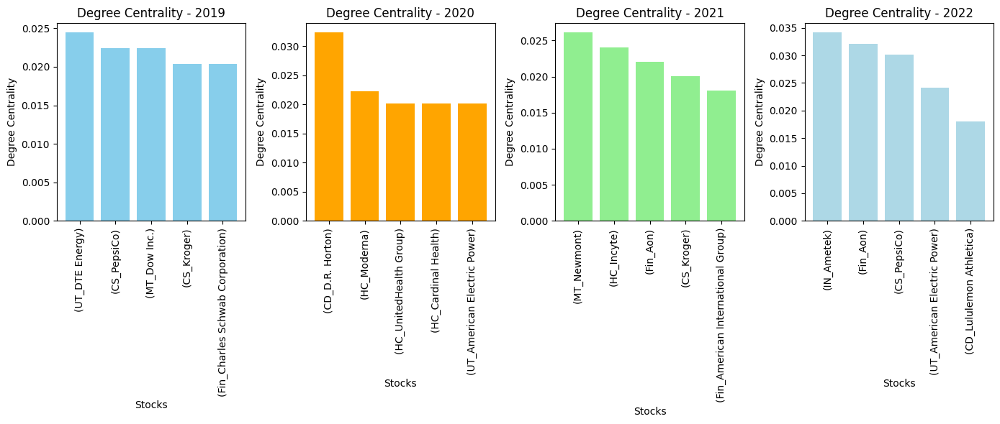

In [ ]:
import matplotlib.pyplot as plt

# Extract top five nodes and their degree centrality values for each year
top_5_degree_19 = degree_19.head(5)
top_5_degree_20 = degree_20.head(5)
top_5_degree_21 = degree_21.head(5)
top_5_degree_22 = degree_22.head(5)

# Plotting the top five nodes for each year
plt.figure(figsize=(14, 6))

# 2019
plt.subplot(141)
plt.bar(top_5_degree_19['Node'], top_5_degree_19['Degree Centrality'], color='skyblue')
plt.title('Degree Centrality - 2019')
plt.xlabel('Stocks')
plt.ylabel('Degree Centrality')
plt.xticks(rotation=90)
plt.tight_layout()

# 2020
plt.subplot(142)
plt.bar(top_5_degree_20['Node'], top_5_degree_20['Degree Centrality'], color='orange')
plt.title('Degree Centrality - 2020')
plt.xlabel('Stocks')
plt.ylabel('Degree Centrality')
plt.xticks(rotation=90)
plt.tight_layout()

# 2021
plt.subplot(143)
plt.bar(top_5_degree_21['Node'], top_5_degree_21['Degree Centrality'], color='lightgreen')
plt.title('Degree Centrality - 2021')
plt.xlabel('Stocks')
plt.ylabel('Degree Centrality')
plt.xticks(rotation=90)
plt.tight_layout()

# 2022
plt.subplot(144)
plt.bar(top_5_degree_22['Node'], top_5_degree_22['Degree Centrality'], color='lightblue')
plt.title('Degree Centrality - 2022')
plt.xlabel('Stocks')
plt.ylabel('Degree Centrality')
plt.xticks(rotation=90)
plt.tight_layout()

plt.show()


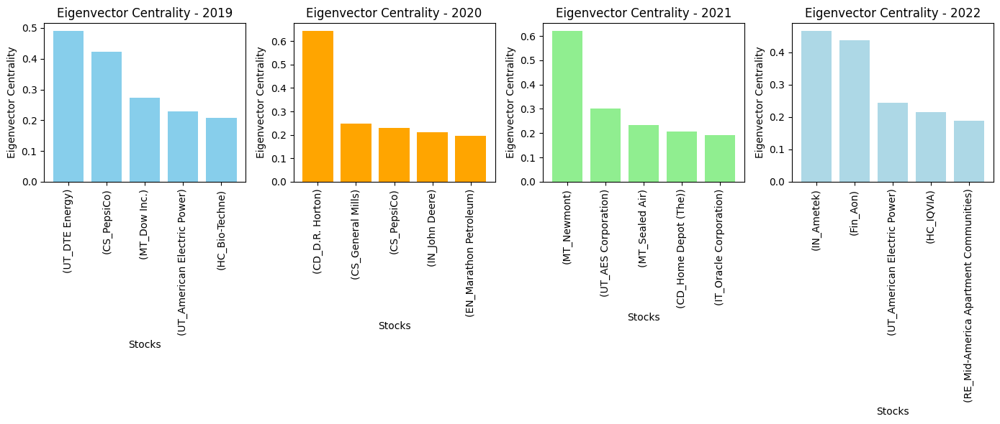

In [ ]:
import matplotlib.pyplot as plt

# Extract top five nodes and their eigenvector centrality values for each year
top_5_eigen_19 = eigen_19.head(5)
top_5_eigen_20 = eigen_20.head(5)
top_5_eigen_21 = eigen_21.head(5)
top_5_eigen_22 = eigen_22.head(5)

# Plotting the top five nodes for each year
plt.figure(figsize=(14, 6))

# 2019
plt.subplot(141)
plt.bar(top_5_eigen_19['Node'], top_5_eigen_19['eigenvector_centrality'], color='skyblue')
plt.title('Eigenvector Centrality - 2019')
plt.xlabel('Stocks')
plt.ylabel('Eigenvector Centrality')
plt.xticks(rotation=90)
plt.tight_layout()

# 2020
plt.subplot(142)
plt.bar(top_5_eigen_20['Node'], top_5_eigen_20['eigenvector_centrality'], color='orange')
plt.title('Eigenvector Centrality - 2020')
plt.xlabel('Stocks')
plt.ylabel('Eigenvector Centrality')
plt.xticks(rotation=90)
plt.tight_layout()

# 2021
plt.subplot(143)
plt.bar(top_5_eigen_21['Node'], top_5_eigen_21['eigenvector_centrality'], color='lightgreen')
plt.title('Eigenvector Centrality - 2021')
plt.xlabel('Stocks')
plt.ylabel('Eigenvector Centrality')
plt.xticks(rotation=90)
plt.tight_layout()

# 2022
plt.subplot(144)
plt.bar(top_5_eigen_22['Node'], top_5_eigen_22['eigenvector_centrality'], color='lightblue')
plt.title('Eigenvector Centrality - 2022')
plt.xlabel('Stocks')
plt.ylabel('Eigenvector Centrality')
plt.xticks(rotation=90)
plt.tight_layout()

plt.show()


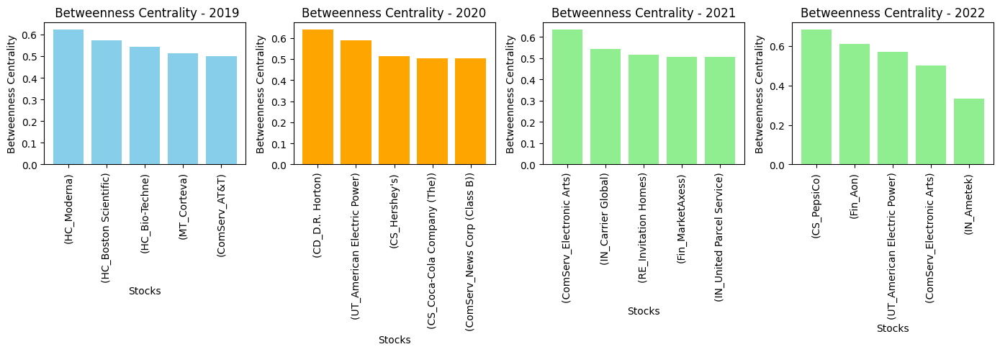

In [ ]:
import matplotlib.pyplot as plt

# Extract top five nodes and their betweenness centrality values for each year
top_5_19 = btw_19.head(5)
top_5_20 = btw_20.head(5)
top_5_21 = btw_21.head(5)
top_5_22 = btw_22.head(5)
# Plotting the top five nodes for each year
plt.figure(figsize=(14, 5))

# 2019
plt.subplot(141)
plt.bar(top_5_19['Node'], top_5_19['betweenness_centrality'], color='skyblue')
plt.title(' Betweenness Centrality - 2019')
plt.xlabel('Stocks')
plt.ylabel('Betweenness Centrality')
plt.xticks(rotation=90)
plt.tight_layout()

# 2020
plt.subplot(142)
plt.bar(top_5_20['Node'], top_5_20['betweenness_centrality'], color='orange')
plt.title('Betweenness Centrality - 2020')
plt.xlabel('Stocks')
plt.ylabel('Betweenness Centrality')
plt.xticks(rotation=90)
plt.tight_layout()

# 2021
plt.subplot(143)
plt.bar(top_5_21['Node'], top_5_21['betweenness_centrality'], color='lightgreen')
plt.title('Betweenness Centrality - 2021')
plt.xlabel('Stocks')
plt.ylabel('Betweenness Centrality')
plt.xticks(rotation=90)
plt.tight_layout()

#2022
plt.subplot(144)
plt.bar(top_5_22['Node'], top_5_22['betweenness_centrality'], color='lightgreen')
plt.title('Betweenness Centrality - 2022')
plt.xlabel('Stocks')
plt.ylabel('Betweenness Centrality')
plt.xticks(rotation=90)
plt.tight_layout()

plt.show()


## Centrality Measures based on clubed sectors

In [ ]:
# Dictionary to store companies by sectors
sectors_dict = {}

# Extract sectors from company names and group them
for company in DistMat_22:
    sector_with_brackets = company.split('_')[0]  # Extract sector with brackets from the company name
    sector = sector_with_brackets.strip('()')[:2]  # Extract sector abbreviation

    # Check if the sector key exists in the dictionary
    if sector in sectors_dict:
        sectors_dict[sector].append(company)
    else:
        sectors_dict[sector] = [company]  # Create a new list for the sector if it doesn't exist

# Display the dictionary containing companies grouped by sectors
for sector, companies in sectors_dict.items():
    print(f"{sector}: {companies}")


CD: ['(CD_Airbnb)', '(CD_Amazon)', '(CD_Aptiv)', '(CD_AutoZone)', '(CD_Bath & Body Works, Inc.)', '(CD_Best Buy)', '(CD_Booking Holdings)', '(CD_BorgWarner)', '(CD_Caesars Entertainment)', '(CD_Carnival)', '(CD_Chipotle Mexican Grill)', '(CD_D.R. Horton)', '(CD_Darden Restaurants)', "(CD_Domino's)", '(CD_Etsy)', '(CD_Expedia Group)', '(CD_Ford Motor Company)', '(CD_Garmin)', '(CD_General Motors)', '(CD_Genuine Parts Company)', '(CD_Hasbro)', '(CD_Hilton Worldwide)', '(CD_Home Depot (The))', '(CD_LKQ Corporation)', '(CD_Las Vegas Sands)', '(CD_Lennar)', "(CD_Lowe's)", '(CD_Lululemon Athletica)', '(CD_MGM Resorts)', '(CD_Marriott International)', "(CD_McDonald's)", '(CD_Mohawk Industries)', '(CD_NVR, Inc.)', '(CD_Nike, Inc.)', '(CD_Norwegian Cruise Line Holdings)', "(CD_O'Reilly Auto Parts)", '(CD_Pool Corporation)', '(CD_PulteGroup)', '(CD_Ralph Lauren Corporation)', '(CD_Ross Stores)', '(CD_Royal Caribbean Group)', '(CD_Starbucks)', '(CD_TJX Companies)', '(CD_Tapestry, Inc.)', '(CD_Tes

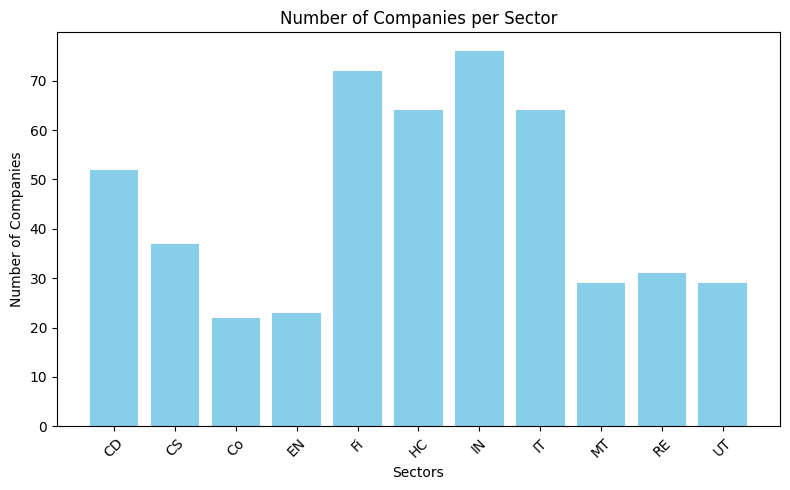

In [ ]:
import matplotlib.pyplot as plt

# Modify your existing code to count companies per sector
sectors_count = {sector: len(companies) for sector, companies in sectors_dict.items()}

# Plotting the count of companies per sector
plt.figure(figsize=(8, 5))
plt.bar(sectors_count.keys(), sectors_count.values(), color='skyblue')
plt.xlabel('Sectors')
plt.ylabel('Number of Companies')
plt.title('Number of Companies per Sector')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [ ]:
import networkx as nx
import numpy as np
import pandas as pd

# Assuming 'DistMat' contains the distance matrix of companies

# Define sectors
sectors = ['ComServ','CD','CS', 'EN','Fin','HC','IN','IT','MT','RE','UT']
# Create a dictionary to store average eigenvector centrality for each sector
sector_avg_eigenvector = {}

# Iterate over sectors
for sector in sectors:
    # Filter companies belonging to the specific sector
    sector_companies = [company for company in DistMat_19.columns if company.startswith(f"({sector}")]

    # Create a subgraph with companies of the specific sector
    subgraph = DistMat_19[sector_companies].loc[sector_companies]
    G = nx.from_numpy_array(np.array(subgraph))

    # Calculate the minimum spanning tree using NetworkX
    mst = nx.minimum_spanning_tree(G)

    # Calculate eigenvector centrality
    eigenvector_centrality = nx.eigenvector_centrality(mst, max_iter=500, tol=1e-6 )

    # Calculate average eigenvector centrality for the sector
    avg_eigenvector = np.mean(list(eigenvector_centrality.values()))

    # Store the average eigenvector centrality for the sector
    sector_avg_eigenvector[sector] = avg_eigenvector

# Convert the dictionary to a DataFrame
avg_eigenvector_19 = pd.DataFrame(list(sector_avg_eigenvector.items()), columns=['Sector', 'Average_Eigenvector'])

# Display the average eigenvector centrality for each sector
print(avg_eigenvector_19)


     Sector  Average_Eigenvector
0   ComServ             0.141500
1        CD             0.080526
2        CS             0.096871
3        EN             0.150077
4       Fin             0.074775
5        HC             0.080536
6        IN             0.059155
7        IT             0.074359
8        MT             0.142778
9        RE             0.131224
10       UT             0.122715


In [ ]:
import networkx as nx
import numpy as np
import pandas as pd

# Assuming 'DistMat' contains the distance matrix of companies

# Define sectors
sectors = ['ComServ','CD','CS', 'EN','Fin','HC','IN','IT','MT','RE','UT']
# Create a dictionary to store average eigenvector centrality for each sector
sector_avg_eigenvector = {}

# Iterate over sectors
for sector in sectors:
    # Filter companies belonging to the specific sector
    sector_companies = [company for company in DistMat_20.columns if company.startswith(f"({sector}")]

    # Create a subgraph with companies of the specific sector
    subgraph = DistMat_20[sector_companies].loc[sector_companies]
    G = nx.from_numpy_array(np.array(subgraph))

    # Calculate the minimum spanning tree using NetworkX
    mst = nx.minimum_spanning_tree(G)

    # Initialize eigenvector_centrality variable
    eigenvector_centrality = {}
    try:
        # Calculate eigenvector centrality with increased max_iter
        eigenvector_centrality = nx.eigenvector_centrality(mst, max_iter=1000, tol=1e-6 )
    except nx.PowerIterationFailedConvergence:
        print(f"Convergence failed for sector: {sector}")
        # Continue to the next sector if the convergence fails
        continue

    # Calculate average eigenvector centrality for the sector
    avg_eigenvector = np.mean(list(eigenvector_centrality.values()))

    # Store the average eigenvector centrality for the sector
    sector_avg_eigenvector[sector] = avg_eigenvector

# Convert the dictionary to a DataFrame
avg_eigenvector_20 = pd.DataFrame(list(sector_avg_eigenvector.items()), columns=['Sector', 'Average_Eigenvector'])

# Display the average eigenvector centrality for each sector
print(avg_eigenvector_20)


     Sector  Average_Eigenvector
0   ComServ             0.164975
1        CD             0.087379
2        CS             0.124472
3        EN             0.165238
4       Fin             0.065193
5        HC             0.081033
6        IN             0.081366
7        IT             0.079410
8        MT             0.137213
9        RE             0.143828
10       UT             0.147737


In [ ]:
import networkx as nx
import numpy as np
import pandas as pd

# Assuming 'DistMat' contains the distance matrix of companies

# Define sectors
sectors = ['ComServ','CD','CS', 'EN','Fin','HC','IN','IT','MT','RE','UT']
# Create a dictionary to store average eigenvector centrality for each sector
sector_avg_eigenvector = {}

# Iterate over sectors
for sector in sectors:
    # Filter companies belonging to the specific sector
    sector_companies = [company for company in DistMat_21.columns if company.startswith(f"({sector}")]

    # Create a subgraph with companies of the specific sector
    subgraph = DistMat_21[sector_companies].loc[sector_companies]
    G = nx.from_numpy_array(np.array(subgraph))

    # Calculate the minimum spanning tree using NetworkX
    mst = nx.minimum_spanning_tree(G)

    # Initialize eigenvector_centrality variable
    eigenvector_centrality = {}
    try:
        # Calculate eigenvector centrality with increased max_iter
        eigenvector_centrality = nx.eigenvector_centrality(mst, max_iter=1000, tol=1e-6 )
    except nx.PowerIterationFailedConvergence:
        print(f"Convergence failed for sector: {sector}")
        # Continue to the next sector if the convergence fails
        continue

    # Calculate average eigenvector centrality for the sector
    avg_eigenvector = np.mean(list(eigenvector_centrality.values()))

    # Store the average eigenvector centrality for the sector
    sector_avg_eigenvector[sector] = avg_eigenvector

# Convert the dictionary to a DataFrame
avg_eigenvector_21 = pd.DataFrame(list(sector_avg_eigenvector.items()), columns=['Sector', 'Average_Eigenvector'])

# Display the average eigenvector centrality for each sector
print(avg_eigenvector_21)


     Sector  Average_Eigenvector
0   ComServ             0.169372
1        CD             0.093460
2        CS             0.111108
3        EN             0.154270
4       Fin             0.069591
5        HC             0.067547
6        IN             0.059244
7        IT             0.077503
8        MT             0.133902
9        RE             0.127621
10       UT             0.129611


In [ ]:
import networkx as nx
import numpy as np
import pandas as pd

# Assuming 'DistMat' contains the distance matrix of companies

# Define sectors
sectors = ['ComServ','CD','CS', 'EN','Fin','HC','IN','IT','MT','RE','UT']
# Create a dictionary to store average eigenvector centrality for each sector
sector_avg_eigenvector = {}

# Iterate over sectors
for sector in sectors:
    # Filter companies belonging to the specific sector
    sector_companies = [company for company in DistMat_22.columns if company.startswith(f"({sector}")]

    # Create a subgraph with companies of the specific sector
    subgraph = DistMat_22[sector_companies].loc[sector_companies]
    G = nx.from_numpy_array(np.array(subgraph))

    # Calculate the minimum spanning tree using NetworkX
    mst = nx.minimum_spanning_tree(G)

    # Initialize eigenvector_centrality variable
    eigenvector_centrality = {}
    try:
        # Calculate eigenvector centrality with increased max_iter
        eigenvector_centrality = nx.eigenvector_centrality(mst, max_iter=1000, tol=1e-6 )
    except nx.PowerIterationFailedConvergence:
        print(f"Convergence failed for sector: {sector}")
        # Continue to the next sector if the convergence fails
        continue

    # Calculate average eigenvector centrality for the sector
    avg_eigenvector = np.mean(list(eigenvector_centrality.values()))

    # Store the average eigenvector centrality for the sector
    sector_avg_eigenvector[sector] = avg_eigenvector

# Convert the dictionary to a DataFrame
avg_eigenvector_22 = pd.DataFrame(list(sector_avg_eigenvector.items()), columns=['Sector', 'Average_Eigenvector'])

# Display the average eigenvector centrality for each sector
print(avg_eigenvector_22)


     Sector  Average_Eigenvector
0   ComServ             0.164201
1        CD             0.081109
2        CS             0.115999
3        EN             0.149780
4       Fin             0.066515
5        HC             0.074139
6        IN             0.062033
7        IT             0.066149
8        MT             0.143852
9        RE             0.117558
10       UT             0.135179


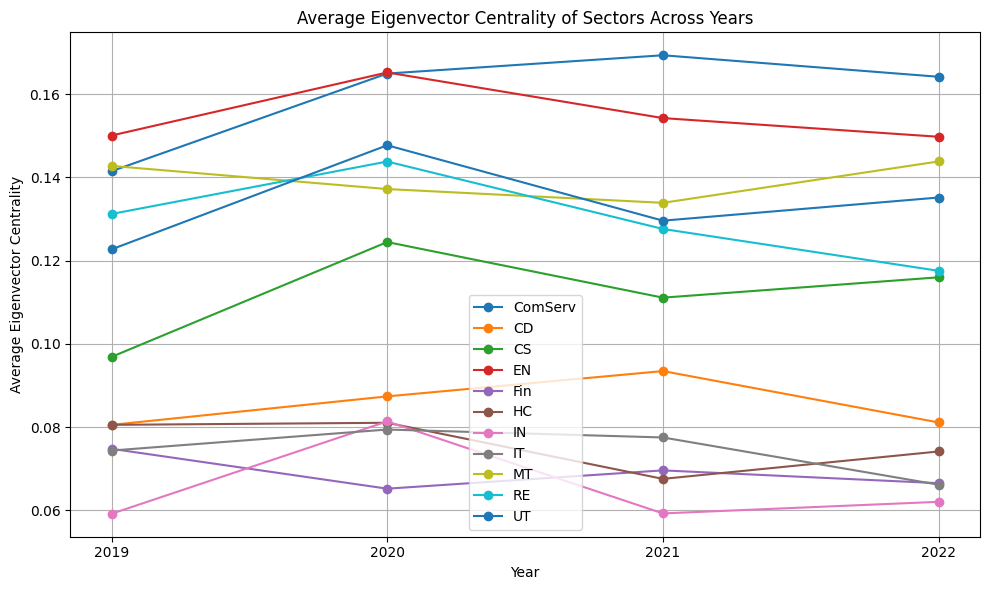

In [ ]:
import matplotlib.pyplot as plt

# Plotting the average eigenvector centrality for each sector across four years
plt.figure(figsize=(10, 6))

# Plotting lines for each sector across years
for sector in avg_eigenvector_19['Sector']:
    data_19 = avg_eigenvector_19[avg_eigenvector_19['Sector'] == sector]['Average_Eigenvector']
    data_20 = avg_eigenvector_20[avg_eigenvector_20['Sector'] == sector]['Average_Eigenvector']
    data_21 = avg_eigenvector_21[avg_eigenvector_21['Sector'] == sector]['Average_Eigenvector']
    data_22 = avg_eigenvector_22[avg_eigenvector_22['Sector'] == sector]['Average_Eigenvector']

    plt.plot(['2019', '2020', '2021', '2022'], [data_19.iloc[0], data_20.iloc[0], data_21.iloc[0], data_22.iloc[0]], label=sector, marker='o')

plt.xlabel('Year')
plt.ylabel('Average Eigenvector Centrality')
plt.title('Average Eigenvector Centrality of Sectors Across Years')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


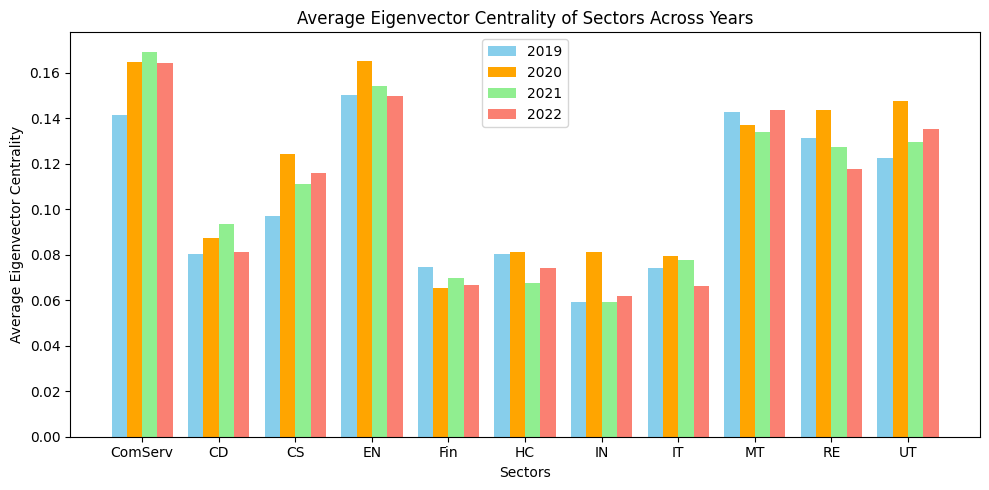

In [ ]:
import matplotlib.pyplot as plt

# Combine the average eigenvector centrality values for each sector across four years
sectors = ['ComServ', 'CD', 'CS', 'EN', 'Fin', 'HC', 'IN', 'IT', 'MT', 'RE', 'UT']
avg_eigenvector_19_values = [avg_eigenvector_19[avg_eigenvector_19['Sector'] == sector]['Average_Eigenvector'].values[0] for sector in sectors]
avg_eigenvector_20_values = [avg_eigenvector_20[avg_eigenvector_20['Sector'] == sector]['Average_Eigenvector'].values[0] for sector in sectors]
avg_eigenvector_21_values = [avg_eigenvector_21[avg_eigenvector_21['Sector'] == sector]['Average_Eigenvector'].values[0] for sector in sectors]
avg_eigenvector_22_values = [avg_eigenvector_22[avg_eigenvector_22['Sector'] == sector]['Average_Eigenvector'].values[0] for sector in sectors]

# Set the width of the bars
bar_width = 0.2
index = range(len(sectors))

# Plotting the bar plots for each year
plt.figure(figsize=(10, 5))

plt.bar(index, avg_eigenvector_19_values, bar_width, label='2019', color='skyblue')
plt.bar([i + bar_width for i in index], avg_eigenvector_20_values, bar_width, label='2020', color='orange')
plt.bar([i + 2 * bar_width for i in index], avg_eigenvector_21_values, bar_width, label='2021', color='lightgreen')
plt.bar([i + 3 * bar_width for i in index], avg_eigenvector_22_values, bar_width, label='2022', color='salmon')

plt.xlabel('Sectors')
plt.ylabel('Average Eigenvector Centrality')
plt.title('Average Eigenvector Centrality of Sectors Across Years')
plt.xticks([i + 1.5 * bar_width for i in index], sectors)
plt.legend()
plt.tight_layout()
plt.show()


## Community Detection

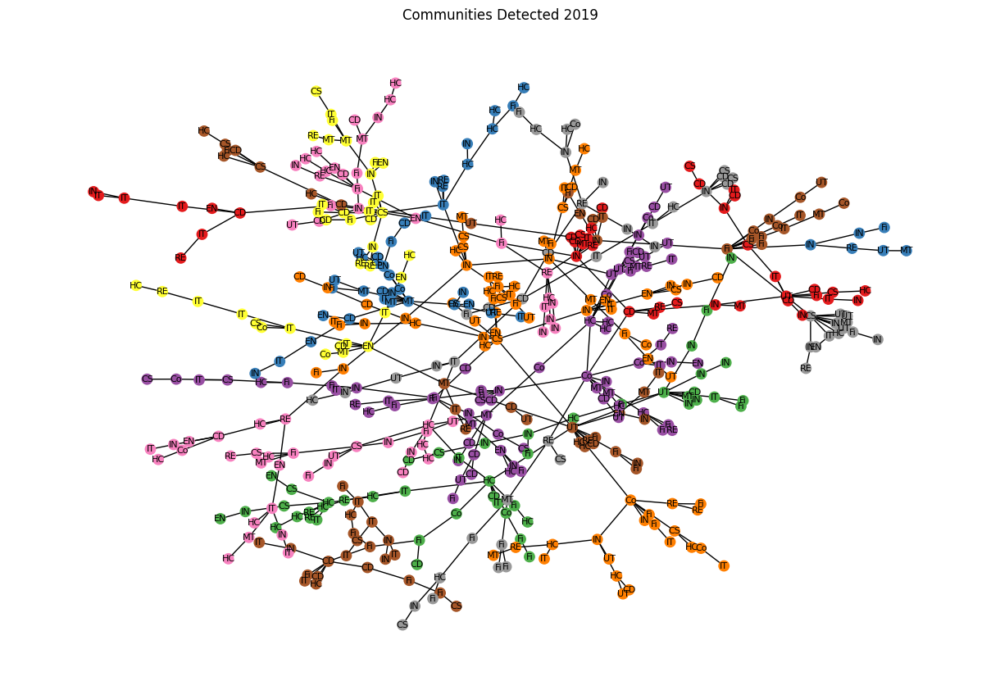

In [ ]:
from community import community_louvain
partition_thresholded_19= community_louvain.best_partition(mst_19)
plt.figure(figsize=(12, 8))
pos_thresholded = nx.spring_layout(mst_19)
node_colors_thresholded = [partition_thresholded_19[node] for node in mst_19.nodes()]
nx.draw(mst_19, pos_thresholded, labels = node_labels_19, with_labels=True, node_color=node_colors_thresholded, cmap=plt.cm.Set1, node_size=80, font_size=8, edge_color='black')
plt.title('Communities Detected 2019')
plt.show()

In [ ]:
# Assuming partition_thresholded maps nodes to communities and node_labels_19 stores label names as a list
sectors_in_communities_19 = {community: [] for community in set(partition_thresholded_19.values())}

for node, community in partition_thresholded_19.items():
    # Assuming node IDs correspond to indices in node_labels_19
    sector_id = node  # Assuming node is the sector ID
    sector_name = node_names_19[sector_id] if sector_id < len(node_names_19) else f"Unknown Sector {sector_id}"
    sectors_in_communities_19[community].append(sector_name)

# Print sectors in each community
for community, sectors in sectors_in_communities_19.items():
    print(f"Community {community}: {sectors}")


Community 0: ['CD', 'CD', 'CD', 'CD', 'CS', 'CS', 'HC', 'IN', 'IT', 'MT', 'MT', 'RE', 'RE']
Community 1: ['CD', 'CD', 'CD', 'CD', 'CS', 'CS', 'CS', 'Fi', 'HC', 'IN', 'IN', 'IN', 'IN', 'IT', 'IT', 'IT', 'MT', 'UT']
Community 2: ['CD', 'EN', 'IN', 'IT', 'IT', 'IT', 'IT', 'RE']
Community 3: ['Fi', 'HC', 'HC', 'HC', 'HC', 'IN', 'IN', 'IT', 'RE', 'RE']
Community 4: ['Fi', 'IN', 'IN', 'MT', 'RE', 'UT']
Community 5: ['CD', 'CD', 'CD', 'CD', 'CS', 'Co', 'Co', 'EN', 'EN', 'EN', 'EN', 'Fi', 'Fi', 'HC', 'HC', 'IN', 'IN', 'IN', 'IT', 'IT', 'IT', 'IT', 'MT', 'MT', 'MT', 'UT', 'UT', 'UT']
Community 6: ['CD', 'CD', 'CS', 'CS', 'Co', 'Co', 'EN', 'EN', 'Fi', 'Fi', 'Fi', 'Fi', 'HC', 'HC', 'HC', 'HC', 'HC', 'HC', 'HC', 'IN', 'IT', 'IT', 'IT', 'IT', 'RE', 'RE', 'RE']
Community 7: ['CD', 'CD', 'CS', 'Fi', 'Fi', 'Fi', 'Fi', 'Fi', 'HC', 'IN', 'IN', 'IN', 'IN', 'IN', 'IN', 'IN', 'IN', 'IT', 'MT', 'UT']
Community 8: ['CD', 'CD', 'CD', 'CD', 'CD', 'CS', 'Co', 'Co', 'Co', 'Fi', 'Fi', 'Fi', 'HC', 'HC', 'HC', 'IN'

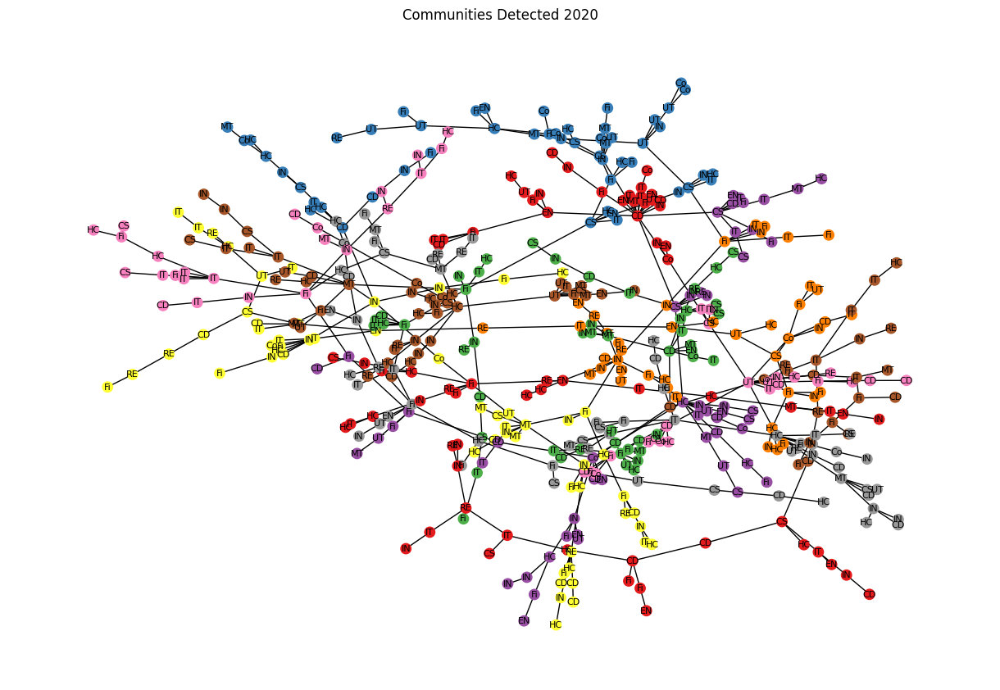

In [ ]:
from community import community_louvain
partition_thresholded_20= community_louvain.best_partition(mst_20)
plt.figure(figsize=(12, 8))
pos_thresholded = nx.spring_layout(mst_20)
node_colors_thresholded = [partition_thresholded_20[node] for node in mst_20.nodes()]
nx.draw(mst_20, pos_thresholded, labels = node_labels_20, with_labels=True, node_color=node_colors_thresholded, cmap=plt.cm.Set1, node_size=80, font_size=8, edge_color='black')

plt.title('Communities Detected 2020')
plt.show()

In [ ]:
# Assuming partition_thresholded maps nodes to communities and node_labels_20 stores label names as a list
sectors_in_communities_20 = {community: [] for community in set(partition_thresholded_20.values())}

for node, community in partition_thresholded_20.items():
    # Assuming node IDs correspond to indices in node_labels_20
    sector_id = node  # Assuming node is the sector ID
    sector_name = node_names_20[sector_id] if sector_id < len(node_names_20) else f"Unknown Sector {sector_id}"
    sectors_in_communities_20[community].append(sector_name)

# Print sectors in each community
for community, sectors in sectors_in_communities_20.items():
    print(f"Community {community}: {sectors}")


Community 0: ['CS', 'EN', 'EN', 'Fi', 'Fi', 'Fi', 'HC', 'HC', 'HC', 'HC', 'HC', 'HC', 'IN', 'IN', 'IN', 'IT', 'IT', 'IT', 'MT', 'RE', 'RE']
Community 1: ['CD', 'CD', 'CD', 'CD', 'Co', 'Co', 'EN', 'EN', 'EN', 'EN', 'Fi', 'Fi', 'Fi', 'Fi', 'HC', 'IN', 'IN', 'IN', 'IN', 'IT', 'IT', 'IT', 'IT', 'IT', 'MT', 'UT', 'UT']
Community 2: ['CD', 'CD', 'CD', 'CS', 'CS', 'EN', 'EN', 'Fi', 'Fi', 'HC', 'HC', 'IN', 'IN', 'IN', 'IN', 'IT', 'IT', 'IT', 'RE', 'RE']
Community 3: ['CD', 'CD', 'CS', 'Co', 'Fi', 'HC', 'HC', 'HC', 'HC', 'IN', 'IN', 'IT', 'MT']
Community 4: ['CS', 'CS', 'CS', 'Co', 'EN', 'Fi', 'Fi', 'HC', 'HC', 'HC', 'HC', 'IN', 'IN', 'IT', 'IT']
Community 5: ['CS', 'Co', 'Co', 'Co', 'Co', 'EN', 'Fi', 'Fi', 'Fi', 'Fi', 'HC', 'IN', 'IN', 'IN', 'MT', 'MT', 'MT', 'RE', 'UT', 'UT', 'UT', 'UT', 'UT', 'UT']
Community 6: ['CD', 'CD', 'CD', 'Fi', 'Fi', 'HC', 'IN', 'IN', 'IT', 'MT', 'RE', 'UT', 'UT']
Community 7: ['CD', 'CD', 'CS', 'Fi', 'Fi', 'Fi', 'HC', 'HC', 'IN', 'IN', 'IT', 'IT', 'IT', 'IT', 'RE']


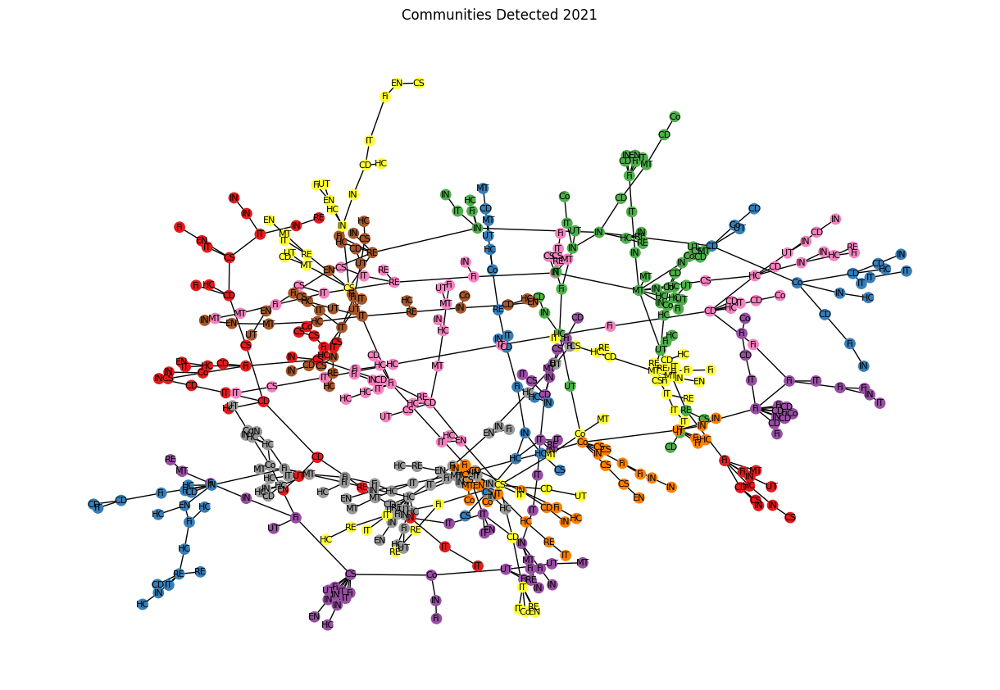

In [ ]:
from community import community_louvain
partition_thresholded_21 = community_louvain.best_partition(mst_21)
plt.figure(figsize=(12, 8))
pos_thresholded = nx.spring_layout(mst_21)
node_colors_thresholded = [partition_thresholded_21[node] for node in mst_21.nodes()]
nx.draw(mst_21, pos_thresholded, labels = node_labels_21, with_labels=True, node_color=node_colors_thresholded, cmap=plt.cm.Set1, node_size=80, font_size=8, edge_color='black')

plt.title('Communities Detected 2021')
plt.show()

In [ ]:
# Assuming partition_thresholded maps nodes to communities and node_labels_21 stores label names as a list
sectors_in_communities_21 = {community: [] for community in set(partition_thresholded_21.values())}

for node, community in partition_thresholded_21.items():
    # Assuming node IDs correspond to indices in node_labels_21
    sector_id = node  # Assuming node is the sector ID
    sector_name = node_names_21[sector_id] if sector_id < len(node_names_21) else f"Unknown Sector {sector_id}"
    sectors_in_communities_21[community].append(sector_name)

# Print sectors in each community
for community, sectors in sectors_in_communities_21.items():
    print(f"Community {community}: {sectors}")


Community 0: ['CD', 'CS', 'CS', 'Fi', 'Fi', 'HC', 'IN', 'IN', 'IN', 'MT', 'UT']
Community 1: ['CD', 'CS', 'CS', 'CS', 'CS', 'CS', 'Co', 'Co', 'EN', 'Fi', 'Fi', 'HC', 'HC', 'IN', 'IN', 'IT', 'IT']
Community 2: ['CD', 'CD', 'CD', 'CD', 'CS', 'CS', 'EN', 'EN', 'Fi', 'Fi', 'HC', 'HC', 'IN', 'IN', 'IN', 'IN', 'IN', 'IT', 'IT', 'IT', 'IT', 'IT', 'RE', 'RE', 'UT']
Community 3: ['CD', 'CD', 'CD', 'CD', 'CD', 'Co', 'Co', 'Fi', 'HC', 'HC', 'IN', 'IN', 'IN', 'IT', 'IT', 'IT', 'UT']
Community 4: ['CD', 'CD', 'CD', 'CD', 'EN', 'Fi', 'Fi', 'Fi', 'HC', 'HC', 'HC', 'HC', 'HC', 'IN', 'IN', 'IT', 'IT', 'RE', 'RE']
Community 5: ['CD', 'CD', 'CS', 'CS', 'CS', 'Co', 'Fi', 'HC', 'HC', 'HC', 'HC', 'IN', 'IN', 'IN', 'IT', 'MT', 'MT', 'RE', 'UT']
Community 6: ['CD', 'CD', 'CD', 'Co', 'Co', 'Fi', 'Fi', 'HC', 'HC', 'HC', 'IN', 'IN', 'IN', 'IN', 'IN', 'IN', 'IT', 'IT', 'IT', 'MT', 'RE', 'RE', 'UT', 'UT']
Community 7: ['CD', 'CD', 'CD', 'CD', 'CS', 'CS', 'Co', 'Co', 'Co', 'EN', 'Fi', 'Fi', 'Fi', 'Fi', 'HC', 'HC', 

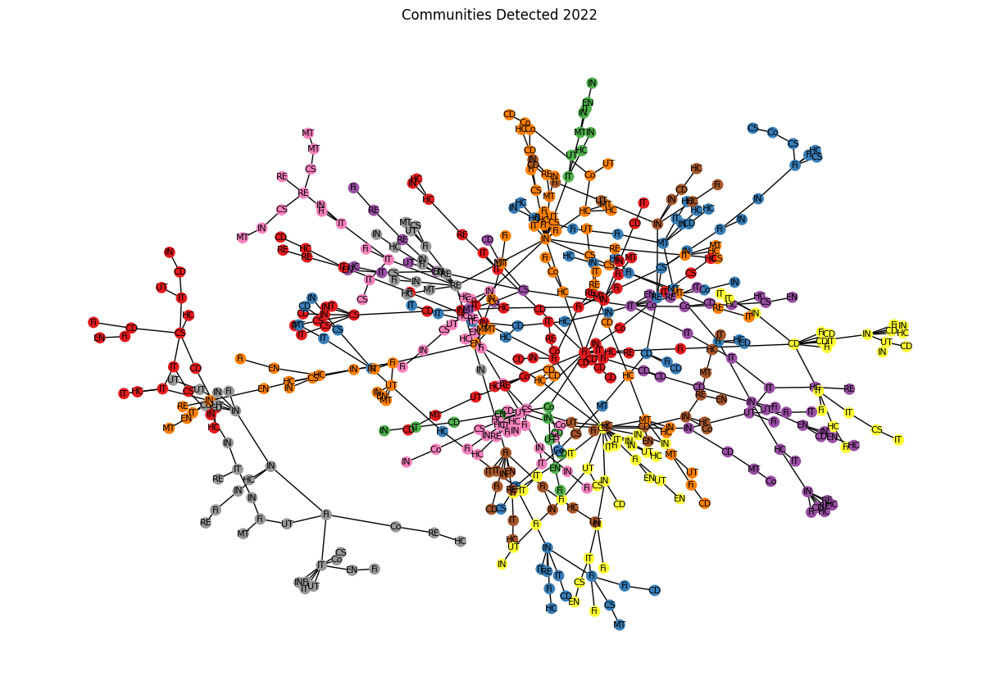

In [ ]:
from community import community_louvain
partition_thresholded_22 = community_louvain.best_partition(mst_22)
plt.figure(figsize=(12, 8))
pos_thresholded = nx.spring_layout(mst_22)
node_colors_thresholded = [partition_thresholded_22[node] for node in mst_22.nodes()]
nx.draw(mst_22, pos_thresholded, labels = node_labels_22, with_labels=True, node_color=node_colors_thresholded, cmap=plt.cm.Set1, node_size=80, font_size=8, edge_color='black')

plt.title('Communities Detected 2022')
plt.show()

In [ ]:
# Assuming partition_thresholded maps nodes to communities and node_labels_19 stores label names as a list
sectors_in_communities_22 = {community: [] for community in set(partition_thresholded_22.values())}

for node, community in partition_thresholded_22.items():
    # Assuming node IDs correspond to indices in node_labels_22
    sector_id = node  # Assuming node is the sector ID
    sector_name = node_names_22[sector_id] if sector_id < len(node_names_22) else f"Unknown Sector {sector_id}"
    sectors_in_communities_22[community].append(sector_name)

# Print sectors in each community
for community, sectors in sectors_in_communities_22.items():
    print(f"Community {community}: {sectors}")


Community 0: ['CD', 'CD', 'CD', 'CD', 'CD', 'CD', 'CD', 'CS', 'Co', 'Co', 'Fi', 'Fi', 'Fi', 'Fi', 'Fi', 'HC', 'HC', 'HC', 'HC', 'HC', 'IN', 'IN', 'IN', 'IN', 'IT', 'IT', 'IT', 'IT', 'IT', 'MT', 'MT', 'RE', 'RE', 'RE', 'UT']
Community 1: ['CD', 'CD', 'CD', 'CD', 'CS', 'CS', 'CS', 'Co', 'Fi', 'Fi', 'Fi', 'HC', 'HC', 'IN', 'IN', 'IN', 'IN', 'IN', 'IT', 'IT', 'IT', 'IT', 'IT', 'IT', 'MT', 'RE', 'RE', 'RE', 'RE']
Community 2: ['CD', 'CD', 'CD', 'CD', 'CS', 'CS', 'EN', 'Fi', 'Fi', 'HC', 'HC', 'HC', 'IN', 'IN', 'IT', 'IT', 'IT', 'IT', 'UT']
Community 3: ['CD', 'CD', 'CD', 'CS', 'CS', 'CS', 'CS', 'Co', 'Co', 'Fi', 'Fi', 'Fi', 'Fi', 'HC', 'HC', 'HC', 'IN', 'IN', 'IN', 'IN', 'IN', 'IT', 'IT', 'IT', 'RE']
Community 4: ['CD', 'CD', 'Fi', 'Fi', 'Fi', 'Fi', 'HC', 'HC', 'HC', 'HC', 'HC', 'HC', 'HC', 'HC', 'IN', 'IN', 'IN', 'IT', 'MT', 'MT']
Community 5: ['CD', 'CD', 'CD', 'CS', 'CS', 'CS', 'CS', 'Co', 'Fi', 'Fi', 'Fi', 'HC', 'HC', 'IN', 'IN', 'IN', 'IT', 'IT', 'IT', 'MT', 'MT', 'MT', 'RE']
Community 

In [ ]:
# Assuming sectors_in_communities_19, sectors_in_communities_20, sectors_in_communities_21, sectors_in_communities_22 contain community information for each respective year

# Calculate the total number of communities for each year
num_communities_19 = len(sectors_in_communities_19)
num_communities_20 = len(sectors_in_communities_20)
num_communities_21 = len(sectors_in_communities_21)
num_communities_22 = len(sectors_in_communities_22)

# Create a DataFrame to display the total number of communities for each year
data = {
    'Year': ['2019', '2020', '2021', '2022'],
    'Total Communities': [num_communities_19, num_communities_20, num_communities_21, num_communities_22]
}

# Create the DataFrame
df_total_communities = pd.DataFrame(data)

# Display the DataFrame showing the total number of communities for each year
df_total_communities


,Year,Total Communities
0,2019,25
1,2020,26
2,2021,24
3,2022,25


KeyError: ignored

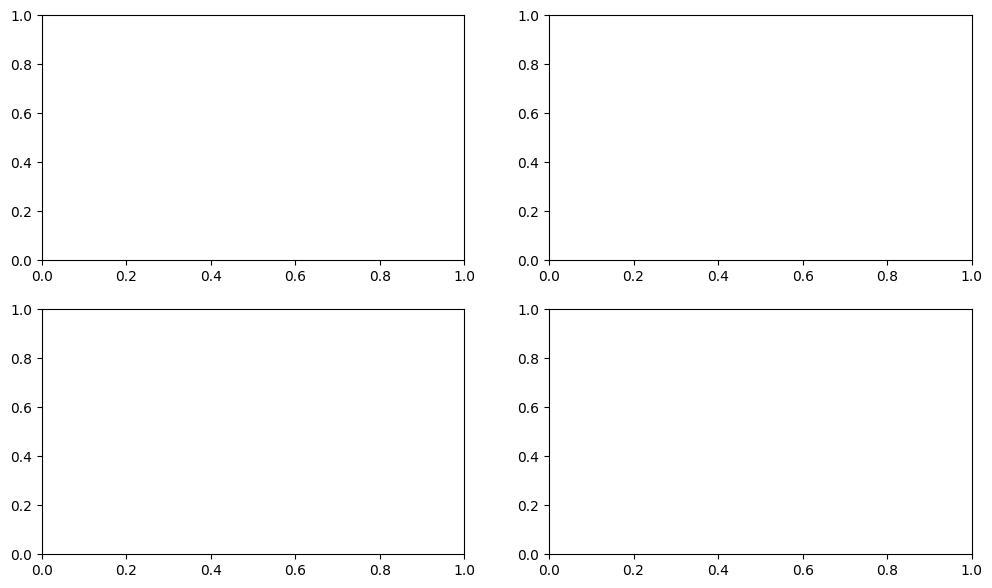

In [ ]:
# Function to visualize a community subgraph for a specific year
def visualize_community_subgraph(ax, partition_data, graph, year, community_id_to_visualize, position):
    nodes_in_community = [node for node, community_id in partition_data.items() if community_id == community_id_to_visualize]
    # Ensure edges are retained in the subgraph
    community_subgraph = graph.subgraph(nodes_in_community).copy()

    pos = nx.spring_layout(community_subgraph, seed=42)  # You can choose any layout algorithm
    pos = {node: (pos[node][0] + position[0], pos[node][1] + position[1]) for node in pos}

    nx.draw(community_subgraph, pos, ax=ax, labels={node: node_labels[year][node] for node in nodes_in_community}, with_labels=True, node_color='skyblue', node_size=300)
    ax.set_title(f'Community {community_id_to_visualize} - Year {year}')

# Create a single plot containing subgraphs for each year
fig, axs = plt.subplots(2, 2, figsize=(12, 7))

for i, (year, partition_data) in enumerate([("19", partition_thresholded_19), ("20", partition_thresholded_20), ("21", partition_thresholded_21), ("22", partition_thresholded_22)]):
    row = i // 2
    col = i % 2
    graph_for_year = globals()[f"mst_{year}"]  # Fetching the graph based on the year variable
    visualize_community_subgraph(axs[row, col], partition_data, graph_for_year, year, 0, position=(col*4, -row*4))

plt.tight_layout()
plt.show()


In [ ]:
# Assuming you have partitions for each year as partition_thresholded_19, partition_thresholded_20, partition_thresholded_21, partition_thresholded_22

# Combine all partitions into a single list for easier iteration
all_partitions = [partition_thresholded_19, partition_thresholded_20, partition_thresholded_21, partition_thresholded_22]

# Create a dictionary to track node transitions between communities
node_transitions = {}

# Loop through the partitions to track node transitions between communities
for i in range(len(all_partitions) - 1):
    current_partition = all_partitions[i]
    next_partition = all_partitions[i + 1]

    for node, comm_year_i in current_partition.items():
        comm_year_iplus1 = next_partition.get(node, -1)

        if comm_year_i != comm_year_iplus1:
            if node not in node_transitions:
                node_transitions[node] = []

            node_transitions[node].append((i + 2019, comm_year_i, comm_year_iplus1))

# Display node transitions
for node, transitions in node_transitions.items():
    print(f"Node {node}:")
    for year, comm_i, comm_iplus1 in transitions:
        print(f"  Year {year}: Community {comm_i} -> Community {comm_iplus1}")


Node 0:
  Year 2019: Community 0 -> Community 24
  Year 2020: Community 24 -> Community 0
Node 3:
  Year 2019: Community 24 -> Community 3
Node 4:
  Year 2019: Community 20 -> Community 12
  Year 2020: Community 12 -> Community 4
Node 5:
  Year 2019: Community 5 -> Community 19
  Year 2020: Community 19 -> Community 5
Node 6:
  Year 2019: Community 5 -> Community 11
  Year 2020: Community 11 -> Community 6
Node 7:
  Year 2019: Community 6 -> Community 7
  Year 2021: Community 7 -> Community 1
Node 8:
  Year 2019: Community 7 -> Community 8
  Year 2021: Community 8 -> Community 5
Node 9:
  Year 2019: Community 5 -> Community 9
  Year 2020: Community 9 -> Community 3
  Year 2021: Community 3 -> Community 8
Node 10:
  Year 2019: Community 8 -> Community 19
  Year 2020: Community 19 -> Community 6
  Year 2021: Community 6 -> Community 3
Node 11:
  Year 2019: Community 9 -> Community 1
  Year 2020: Community 1 -> Community 22
  Year 2021: Community 22 -> Community 9
Node 12:
  Year 2019: Co

In [ ]:
# Assuming you have stored community memberships for each year in separate dictionaries:
# sectors_in_communities_19, sectors_in_communities_20, sectors_in_communities_21, sectors_in_communities_22

# Create sets of unique communities for each year
communities_19 = set(sectors_in_communities_19.keys())
communities_20 = set(sectors_in_communities_20.keys())
communities_21 = set(sectors_in_communities_21.keys())
communities_22 = set(sectors_in_communities_22.keys())

# Identify common and unique communities across years
common_communities = communities_19.intersection(communities_20, communities_21, communities_22)
unique_communities_19 = communities_19 - common_communities
unique_communities_20 = communities_20 - common_communities
unique_communities_21 = communities_21 - common_communities
unique_communities_22 = communities_22 - common_communities

# Track changes in community memberships between consecutive years
# Example: Changes from 2019 to 2020
community_changes_19_to_20 = {
    community: (
        set(sectors_in_communities_20.get(community, [])) - set(sectors_in_communities_19.get(community, [])),
        set(sectors_in_communities_19.get(community, [])) - set(sectors_in_communities_20.get(community, []))
    ) for community in common_communities
}

# Similarly, track changes for other year transitions (e.g., 2020 to 2021, 2021 to 2022)

# Print the identified communities and changes
print("Common Communities Across Years:", common_communities)
print("Unique Communities in 2019:", unique_communities_19)
print("Unique Communities in 2020:", unique_communities_20)
print("Unique Communities in 2021:", unique_communities_21)
print("Unique Communities in 2022:", unique_communities_22)
"\nChanges from 2019 to 2020:", community_changes_19_to_20
# Print changes for other year transitions as well


Common Communities Across Years: {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23}
Unique Communities in 2019: {24}
Unique Communities in 2020: {24, 25}
Unique Communities in 2021: set()
Unique Communities in 2022: {24}


('\nChanges from 2019 to 2020:',
 {0: ({'EN', 'Fi'}, {'CD'}),
  1: ({'Co', 'EN'}, {'CS'}),
  2: ({'CS', 'Fi', 'HC'}, set()),
  3: ({'CD', 'CS', 'Co', 'MT'}, {'RE'}),
  4: ({'CS', 'Co', 'EN', 'HC', 'IT'}, {'MT', 'RE', 'UT'}),
  5: ({'RE'}, {'CD', 'IT'}),
  6: ({'MT', 'UT'}, {'CS', 'Co', 'EN'}),
  7: ({'RE'}, {'MT', 'UT'}),
  8: ({'EN'}, {'Fi', 'UT'}),
  9: ({'RE', 'UT'}, set()),
  10: (set(), {'Co', 'RE', 'UT'}),
  11: ({'Co', 'MT'}, {'CS', 'RE'}),
  12: ({'EN'}, {'CS', 'Co'}),
  13: ({'RE'}, {'MT'}),
  14: ({'Fi', 'UT'}, set()),
  15: ({'Co', 'HC', 'UT'}, {'CS', 'EN', 'IT', 'MT'}),
  16: ({'RE'}, {'Co', 'EN', 'UT'}),
  17: ({'MT', 'RE', 'UT'}, set()),
  18: ({'CS', 'Co'}, set()),
  19: ({'Co', 'IT'}, {'UT'}),
  20: ({'CS', 'Co'}, {'EN', 'MT'}),
  21: ({'CS', 'Fi'}, {'Co', 'EN'}),
  22: ({'CD', 'Co'}, {'CS', 'Fi', 'HC', 'IN', 'MT', 'RE'}),
  23: ({'CD'}, {'EN', 'IN', 'UT'})})

In [ ]:
community_changes_20_to_21 = {
    community: (
        set(sectors_in_communities_21.get(community, [])) - set(sectors_in_communities_20.get(community, [])),
        set(sectors_in_communities_20.get(community, [])) - set(sectors_in_communities_21.get(community, []))
    ) for community in common_communities
}
"\nChanges from 2020 to 2021:", community_changes_20_to_21

('\nChanges from 2020 to 2021:',
 {0: ({'CD', 'UT'}, {'EN', 'IT', 'RE'}),
  1: ({'CS'}, {'MT', 'UT'}),
  2: ({'UT'}, set()),
  3: ({'UT'}, {'CS', 'MT'}),
  4: ({'CD', 'RE'}, {'CS', 'Co'}),
  5: ({'CD', 'IT'}, {'EN'}),
  6: ({'Co'}, set()),
  7: ({'Co', 'EN', 'MT', 'UT'}, set()),
  8: ({'Fi'}, {'Co', 'HC'}),
  9: (set(), {'CD'}),
  10: ({'Co'}, {'CS', 'EN', 'HC', 'MT'}),
  11: ({'CS'}, {'CD', 'IT', 'MT'}),
  12: ({'Co'}, {'UT'}),
  13: ({'MT'}, {'IN'}),
  14: ({'IN'}, {'Co'}),
  15: ({'CS', 'EN', 'IT', 'MT'}, {'Co', 'UT'}),
  16: ({'Co', 'EN', 'UT'}, {'CS'}),
  17: (set(), {'MT'}),
  18: (set(), {'CD', 'Co', 'EN', 'HC', 'UT'}),
  19: ({'EN', 'UT'}, {'Co'}),
  20: (set(), set()),
  21: ({'Co', 'UT'}, {'CS', 'RE'}),
  22: ({'EN', 'Fi', 'HC', 'IN', 'IT', 'MT', 'RE', 'UT'}, {'Co'}),
  23: ({'EN', 'IN', 'UT'}, {'CD', 'MT'})})

In [ ]:
community_changes_21_to_22 = {
    community: (
        set(sectors_in_communities_22.get(community, [])) - set(sectors_in_communities_21.get(community, [])),
        set(sectors_in_communities_21.get(community, [])) - set(sectors_in_communities_22.get(community, []))
    ) for community in common_communities
}
"\nChanges from 2021 to 2022:", community_changes_21_to_22

('\nChanges from 2021 to 2022:',
 {0: ({'Co', 'IT', 'RE'}, set()),
  1: ({'MT', 'RE'}, {'EN'}),
  2: (set(), {'RE'}),
  3: ({'CS', 'RE'}, {'UT'}),
  4: ({'MT'}, {'EN', 'RE'}),
  5: (set(), {'UT'}),
  6: ({'EN'}, {'HC', 'MT', 'RE'}),
  7: (set(), {'CD', 'CS', 'Co', 'Fi', 'RE'}),
  8: ({'Co', 'HC', 'UT'}, {'IN'}),
  9: ({'CD'}, {'CS', 'EN'}),
  10: ({'EN', 'HC', 'RE', 'UT'}, {'Co'}),
  11: ({'CD', 'IT', 'MT', 'RE'}, {'Co', 'EN'}),
  12: ({'CS', 'UT'}, {'Co'}),
  13: ({'IN'}, {'EN'}),
  14: (set(), {'EN', 'MT', 'RE'}),
  15: ({'UT'}, {'MT', 'RE'}),
  16: (set(), {'Co', 'EN', 'IT', 'MT', 'RE'}),
  17: ({'EN'}, {'CS'}),
  18: ({'CD', 'Co', 'EN', 'HC', 'UT'}, set()),
  19: ({'Co'}, {'MT'}),
  20: ({'MT'}, {'CD', 'Co', 'HC', 'UT'}),
  21: ({'CS'}, {'CD', 'IT', 'MT'}),
  22: ({'CS'}, {'CD', 'IT'}),
  23: ({'Co', 'MT'}, set())})

This code snippet compares communities across the four years, identifies common communities, and tracks unique communities for each year. It also tracks changes in community memberships between consecutive years (e.g., from 2019 to 2020) for the common communities.

You can adapt this code by including additional comparisons between other years, aggregating statistics on changes, or visualizing the community evolution based on your specific analysis requirements. Adjust the variable names and structures based on your actual data storage and requirements.







## MaxEigen Values and MeanCorrelation

In [ ]:
import pandas as pd
import numpy as np

# Assuming 'corr_matrix_19' contains the correlation matrix of companies

sectors = ['ComServ', 'CD', 'CS', 'EN', 'Fin', 'HC', 'IN', 'IT', 'MT', 'RE', 'UT']
sector_avg_corr = {}  # Dictionary to store mean correlations
sector_max_eigen = {}  # Dictionary to store maximum eigenvalues

# Iterate over sectors
for sector in sectors:
    # Filter companies belonging to the specific sector
    sector_companies = [company for company in corr_19.columns if company.startswith(f"({sector}")]

    # Create a submatrix with companies of the specific sector
    submatrix = corr_19.loc[sector_companies, sector_companies]

    # Calculate mean correlation for the sector
    mean_corr = submatrix.mean().mean()
    sector_avg_corr[sector] = mean_corr

    # Calculate maximum eigenvalue for the sector
    max_eigen = np.max(np.linalg.eigvals(submatrix))
    sector_max_eigen[sector] = max_eigen

# Convert dictionaries to DataFrames
avg_corr_19 = pd.DataFrame(list(sector_avg_corr.items()), columns=['Sector', 'Mean_Correlation'])
max_eigen_19 = pd.DataFrame(list(sector_max_eigen.items()), columns=['Sector', 'Max_Eigenvalue'])

# Merge DataFrames on 'Sector'
result = pd.merge(avg_corr_19, max_eigen_19, on='Sector')

# Display the calculated values in a table
result


,Sector,Mean_Correlation,Max_Eigenvalue
0,ComServ,0.284695,6.935227
1,CD,0.272359,15.679705
2,CS,0.304839,11.741131
3,EN,0.247722,6.266195
4,Fin,0.278375,21.385810
5,HC,0.244817,17.058307
6,IN,0.272385,22.647704
7,IT,0.263029,17.749758
8,MT,0.282741,8.922413
9,RE,0.237406,7.982503


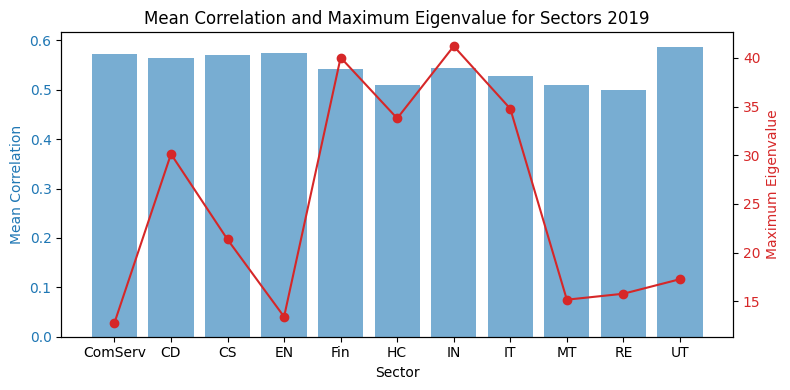

In [ ]:
import matplotlib.pyplot as plt

# Assuming you've calculated avg_corr_df and max_eigen_df as shown in the previous code

fig, ax1 = plt.subplots(figsize=(8, 4))

# Plot Mean Correlation on primary y-axis
ax1.set_xlabel('Sector')
ax1.set_ylabel('Mean Correlation', color='tab:blue')
ax1.bar(avg_corr_19['Sector'], avg_corr_19['Mean_Correlation'], color='tab:blue', alpha=0.6)
ax1.tick_params(axis='y', labelcolor='tab:blue')

# Create a secondary y-axis
ax2 = ax1.twinx()
ax2.set_ylabel('Maximum Eigenvalue', color='tab:red')
ax2.plot(max_eigen_19['Sector'], max_eigen_19['Max_Eigenvalue'], color='tab:red', marker='o')
ax2.tick_params(axis='y', labelcolor='tab:red')

# Rotate x-axis labels for better readability (if needed)
plt.xticks(rotation=45)

# Title and display
plt.title('Mean Correlation and Maximum Eigenvalue for Sectors 2019')
fig.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import numpy as np

# Assuming 'corr_matrix_19' contains the correlation matrix of companies

sectors = ['ComServ', 'CD', 'CS', 'EN', 'Fin', 'HC', 'IN', 'IT', 'MT', 'RE', 'UT']
sector_avg_corr = {}  # Dictionary to store mean correlations
sector_max_eigen = {}  # Dictionary to store maximum eigenvalues

# Iterate over sectors
for sector in sectors:
    # Filter companies belonging to the specific sector
    sector_companies = [company for company in corr_20.columns if company.startswith(f"({sector}")]

    # Create a submatrix with companies of the specific sector
    submatrix = corr_20.loc[sector_companies, sector_companies]

    # Calculate mean correlation for the sector
    mean_corr = submatrix.mean().mean()
    sector_avg_corr[sector] = mean_corr

    # Calculate maximum eigenvalue for the sector
    max_eigen = np.max(np.linalg.eigvals(submatrix))
    sector_max_eigen[sector] = max_eigen

# Convert dictionaries to DataFrames
avg_corr_20 = pd.DataFrame(list(sector_avg_corr.items()), columns=['Sector', 'Mean_Correlation'])
max_eigen_20 = pd.DataFrame(list(sector_max_eigen.items()), columns=['Sector', 'Max_Eigenvalue'])

# Merge DataFrames on 'Sector'
result = pd.merge(avg_corr_20, max_eigen_20, on='Sector')

# Display the calculated values in a table
result


,Sector,Mean_Correlation,Max_Eigenvalue
0,ComServ,0.572898,12.793040
1,CD,0.564039,30.131248
2,CS,0.570064,21.355149
3,EN,0.574279,13.423296
4,Fin,0.542766,40.037059
5,HC,0.510154,33.795542
6,IN,0.544551,41.205441
7,IT,0.528454,34.784134
8,MT,0.510100,15.175221
9,RE,0.500090,15.786451


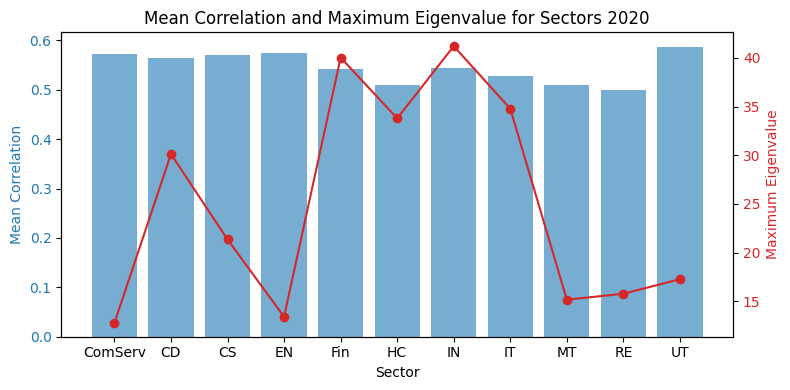

In [ ]:
import matplotlib.pyplot as plt

# Assuming you've calculated avg_corr_df and max_eigen_df as shown in the previous code

fig, ax1 = plt.subplots(figsize=(8, 4))

# Plot Mean Correlation on primary y-axis
ax1.set_xlabel('Sector')
ax1.set_ylabel('Mean Correlation', color='tab:blue')
ax1.bar(avg_corr_20['Sector'], avg_corr_20['Mean_Correlation'], color='tab:blue', alpha=0.6)
ax1.tick_params(axis='y', labelcolor='tab:blue')

# Create a secondary y-axis
ax2 = ax1.twinx()
ax2.set_ylabel('Maximum Eigenvalue', color='tab:red')
ax2.plot(max_eigen_20['Sector'], max_eigen_20['Max_Eigenvalue'], color='tab:red', marker='o')
ax2.tick_params(axis='y', labelcolor='tab:red')

# Rotate x-axis labels for better readability (if needed)
plt.xticks(rotation=45)

# Title and display
plt.title('Mean Correlation and Maximum Eigenvalue for Sectors 2020')
fig.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import numpy as np

# Assuming 'corr_matrix_19' contains the correlation matrix of companies

sectors = ['ComServ', 'CD', 'CS', 'EN', 'Fin', 'HC', 'IN', 'IT', 'MT', 'RE', 'UT']
sector_avg_corr = {}  # Dictionary to store mean correlations
sector_max_eigen = {}  # Dictionary to store maximum eigenvalues

# Iterate over sectors
for sector in sectors:
    # Filter companies belonging to the specific sector
    sector_companies = [company for company in corr_21.columns if company.startswith(f"({sector}")]

    # Create a submatrix with companies of the specific sector
    submatrix = corr_21.loc[sector_companies, sector_companies]

    # Calculate mean correlation for the sector
    mean_corr = submatrix.mean().mean()
    sector_avg_corr[sector] = mean_corr

    # Calculate maximum eigenvalue for the sector
    max_eigen = np.max(np.linalg.eigvals(submatrix))
    sector_max_eigen[sector] = max_eigen

# Convert dictionaries to DataFrames
avg_corr_21 = pd.DataFrame(list(sector_avg_corr.items()), columns=['Sector', 'Mean_Correlation'])
max_eigen_21 = pd.DataFrame(list(sector_max_eigen.items()), columns=['Sector', 'Max_Eigenvalue'])

# Merge DataFrames on 'Sector'
result = pd.merge(avg_corr_21, max_eigen_21, on='Sector')

# Display the calculated values in a table
result


,Sector,Mean_Correlation,Max_Eigenvalue
0,ComServ,0.262682,6.426282
1,CD,0.268176,15.290260
2,CS,0.255578,10.423270
3,EN,0.278569,6.917640
4,Fin,0.268021,20.817828
5,HC,0.242655,17.519962
6,IN,0.253690,21.962290
7,IT,0.260599,18.839084
8,MT,0.258625,7.877044
9,RE,0.236620,8.111821


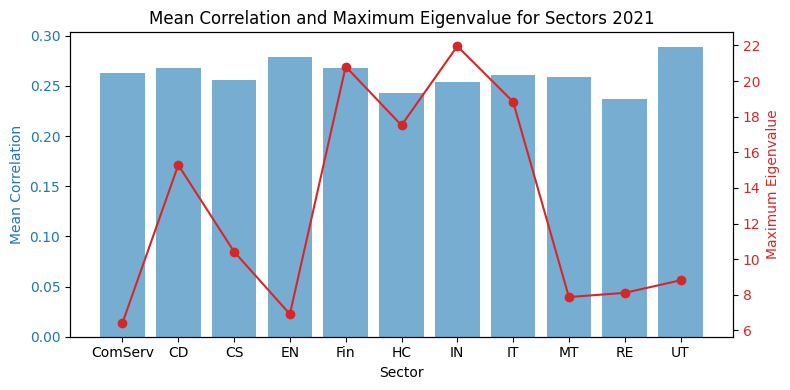

In [ ]:
import matplotlib.pyplot as plt

# Assuming you've calculated avg_corr_df and max_eigen_df as shown in the previous code

fig, ax1 = plt.subplots(figsize=(8, 4))

# Plot Mean Correlation on primary y-axis
ax1.set_xlabel('Sector')
ax1.set_ylabel('Mean Correlation', color='tab:blue')
ax1.bar(avg_corr_21['Sector'], avg_corr_21['Mean_Correlation'], color='tab:blue', alpha=0.6)
ax1.tick_params(axis='y', labelcolor='tab:blue')

# Create a secondary y-axis
ax2 = ax1.twinx()
ax2.set_ylabel('Maximum Eigenvalue', color='tab:red')
ax2.plot(max_eigen_21['Sector'], max_eigen_21['Max_Eigenvalue'], color='tab:red', marker='o')
ax2.tick_params(axis='y', labelcolor='tab:red')

# Rotate x-axis labels for better readability (if needed)
plt.xticks(rotation=45)

# Title and display
plt.title('Mean Correlation and Maximum Eigenvalue for Sectors 2021')
fig.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import numpy as np

# Assuming 'corr_matrix_19' contains the correlation matrix of companies

sectors = ['ComServ', 'CD', 'CS', 'EN', 'Fin', 'HC', 'IN', 'IT', 'MT', 'RE', 'UT']
sector_avg_corr = {}  # Dictionary to store mean correlations
sector_max_eigen = {}  # Dictionary to store maximum eigenvalues

# Iterate over sectors
for sector in sectors:
    # Filter companies belonging to the specific sector
    sector_companies = [company for company in corr_19.columns if company.startswith(f"({sector}")]

    # Create a submatrix with companies of the specific sector
    submatrix = corr_22.loc[sector_companies, sector_companies]

    # Calculate mean correlation for the sector
    mean_corr = submatrix.mean().mean()
    sector_avg_corr[sector] = mean_corr

    # Calculate maximum eigenvalue for the sector
    max_eigen = np.max(np.linalg.eigvals(submatrix))
    sector_max_eigen[sector] = max_eigen

# Convert dictionaries to DataFrames
avg_corr_22 = pd.DataFrame(list(sector_avg_corr.items()), columns=['Sector', 'Mean_Correlation'])
max_eigen_22 = pd.DataFrame(list(sector_max_eigen.items()), columns=['Sector', 'Max_Eigenvalue'])

# Merge DataFrames on 'Sector'
result = pd.merge(avg_corr_22, max_eigen_22, on='Sector')

# Display the calculated values in a table
result


,Sector,Mean_Correlation,Max_Eigenvalue
0,ComServ,0.433204,9.953632
1,CD,0.428403,23.225587
2,CS,0.444097,16.571092
3,EN,0.407815,9.723553
4,Fin,0.471124,34.377039
5,HC,0.375263,24.728677
6,IN,0.461382,35.254559
7,IT,0.453919,29.153727
8,MT,0.426952,12.849419
9,RE,0.402681,12.988512


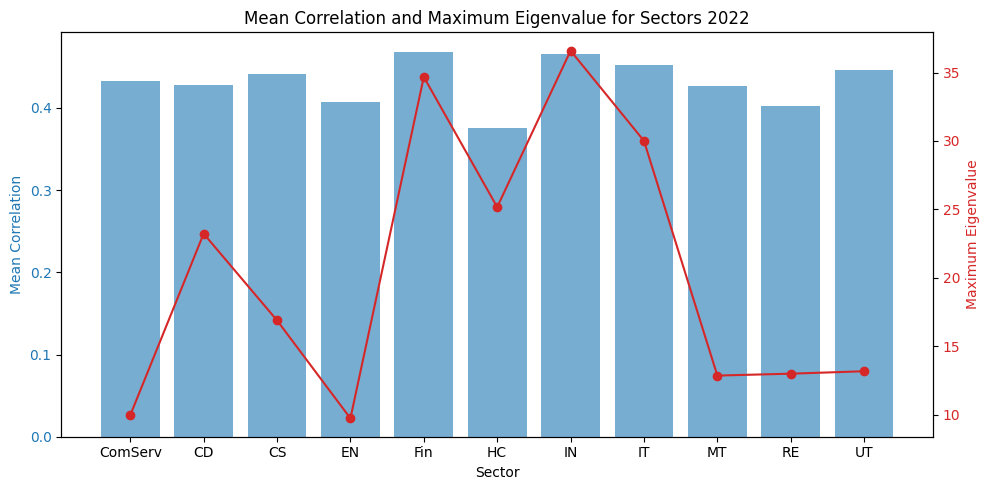

In [ ]:
import matplotlib.pyplot as plt

# Assuming you've calculated avg_corr_df and max_eigen_df as shown in the previous code

fig, ax1 = plt.subplots(figsize=(10, 5))

# Plot Mean Correlation on primary y-axis
ax1.set_xlabel('Sector')
ax1.set_ylabel('Mean Correlation', color='tab:blue')
ax1.bar(avg_corr_22['Sector'], avg_corr_22['Mean_Correlation'], color='tab:blue', alpha=0.6)
ax1.tick_params(axis='y', labelcolor='tab:blue')

# Create a secondary y-axis
ax2 = ax1.twinx()
ax2.set_ylabel('Maximum Eigenvalue', color='tab:red')
ax2.plot(max_eigen_22['Sector'], max_eigen_22['Max_Eigenvalue'], color='tab:red', marker='o')
ax2.tick_params(axis='y', labelcolor='tab:red')

# Rotate x-axis labels for better readability (if needed)
plt.xticks(rotation=45)

# Title and display
plt.title('Mean Correlation and Maximum Eigenvalue for Sectors 2022')
fig.tight_layout()
plt.show()


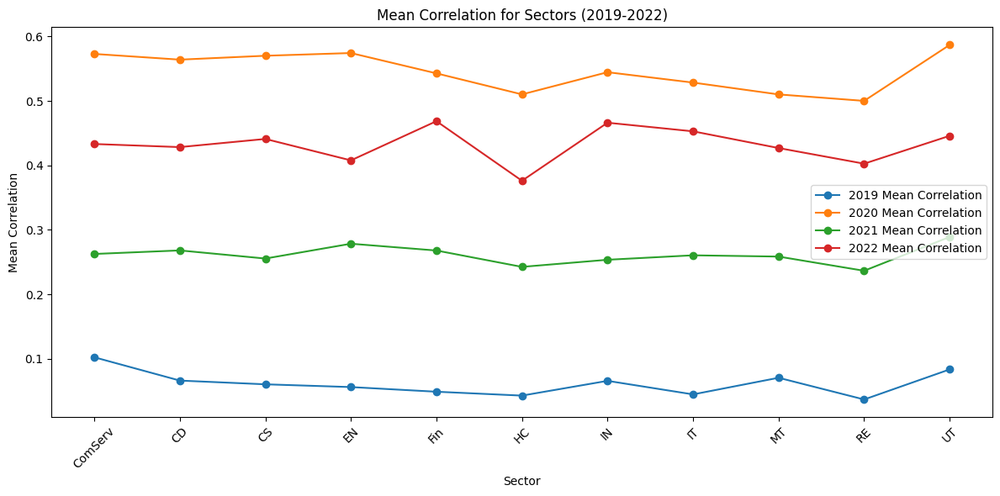

In [ ]:
import matplotlib.pyplot as plt

# Concatenate dataframes for all four years (assuming you have avg_corr_19, avg_corr_20, avg_corr_21, avg_corr_22)
avg_corr_combined = pd.concat([avg_corr_19, avg_corr_20, avg_corr_21, avg_corr_22], keys=['2019', '2020', '2021', '2022'])

# Reset index for proper plotting
avg_corr_combined.reset_index(inplace=True)

fig, ax = plt.subplots(figsize=(12, 6))

# Plot Mean Correlation for all four years
for year, color in zip(['2019', '2020', '2021', '2022'], ['tab:blue', 'tab:orange', 'tab:green', 'tab:red']):
    data_year = avg_corr_combined[avg_corr_combined['level_0'] == year]
    ax.plot(data_year['Sector'], data_year['Mean_Correlation'], marker='o', label=f'{year} Mean Correlation', color=color)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)
plt.legend()
plt.xlabel('Sector')
plt.ylabel('Mean Correlation')
plt.title('Mean Correlation for Sectors (2019-2022)')
plt.tight_layout()
plt.show()


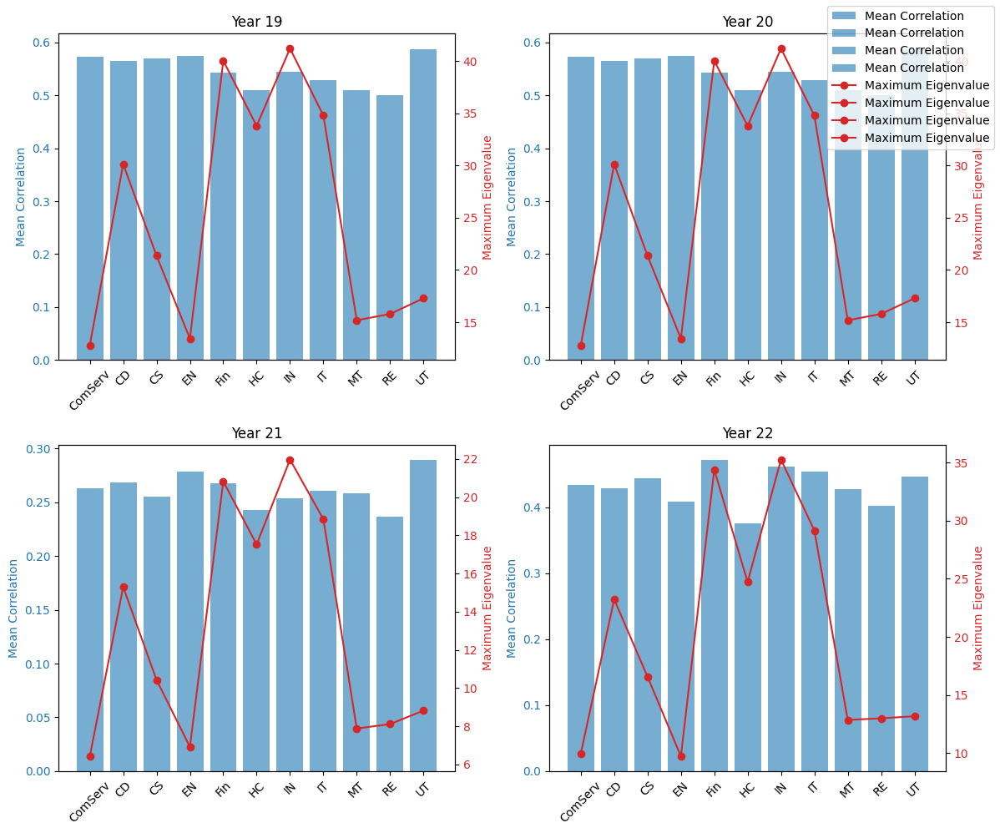

In [ ]:
import matplotlib.pyplot as plt

years = ["19", "20", "21", "22"]  # List of years

fig, axs = plt.subplots(2, 2, figsize=(12, 10))

for i, year in enumerate(years):
    # Example Data (Replace with your actual variable names)
    avg_corr = globals()[f"avg_corr_{year}"]  # DataFrame for mean correlation
    max_eigen = globals()[f"max_eigen_{year}"]  # DataFrame for max eigenvalue

    # Calculate the position in the grid
    row = i // 2
    col = i % 2

    # Plot Mean Correlation on primary y-axis
    ax = axs[row, col]
    ax.bar(avg_corr['Sector'], avg_corr['Mean_Correlation'], color='tab:blue', alpha=0.6, label='Mean Correlation')
    ax.tick_params(axis='y', labelcolor='tab:blue')
    ax.set_ylabel('Mean Correlation', color='tab:blue')

    # Create a secondary y-axis
    ax2 = ax.twinx()
    ax2.plot(max_eigen['Sector'], max_eigen['Max_Eigenvalue'], color='tab:red', marker='o', label='Maximum Eigenvalue')
    ax2.tick_params(axis='y', labelcolor='tab:red')
    ax2.set_ylabel('Maximum Eigenvalue', color='tab:red')

    # Title for the plot
    ax.set_title(f'Year {year}')

    # Rotate x-axis labels for better readability (if needed)
    plt.setp(ax.get_xticklabels(), rotation=45)

# Add legend for all subplots
fig.legend(loc='upper right')

# Adjust layout and display the plot
plt.tight_layout()
plt.show()


## Network Dynamics

In [ ]:
import warnings

# Ignore all warnings (not recommended in general)
warnings.filterwarnings("ignore")
# Your code generating warnings


In [ ]:
import networkx as nx
import numpy as np
import pandas as pd

# Assuming 'DistMat' contains the distance matrix of companies

# Define sectors
sectors = ['ComServ', 'CD', 'CS', 'EN', 'Fin', 'HC', 'IN', 'IT', 'MT', 'RE', 'UT']

# Initialize an empty DataFrame to store metrics
metrics_df = pd.DataFrame(columns=['Sector', 'Nodes', 'Edges', 'Avg_Degree', 'Path_Length', 'Betweenness_Centrality', 'Closeness_Centrality', 'Eigenvector_Centrality'])

# Iterate over sectors
for sector in sectors:
    # Filter companies belonging to the specific sector
    sector_companies = [company for company in DistMat_19.columns if company.startswith(f"({sector}")]

    # Create a subgraph with companies of the specific sector
    subgraph = DistMat_19[sector_companies].loc[sector_companies]
    G = nx.from_numpy_array(np.array(subgraph))

    # Calculate the minimum spanning tree using NetworkX
    mst = nx.minimum_spanning_tree(G)

    # Calculate desired metrics
    nodes = len(mst.nodes())
    edges = len(mst.edges())
    avg_degree = np.mean([val for (node, val) in mst.degree()])
    path_length = nx.average_shortest_path_length(mst)
    betweenness_centrality = nx.betweenness_centrality(mst)
    closeness_centrality = nx.closeness_centrality(mst)
    eigenvector_centrality = nx.eigenvector_centrality(mst, max_iter=500, tol=1e-6)


    # Add the calculated metrics to the DataFrame
    metrics_df = metrics_df.append({'Sector': sector,
                                    'Nodes': nodes,
                                    'Edges': edges,
                                    'Avg_Degree': avg_degree,
                                    'Path_Length': path_length,
                                    'Betweenness_Centrality': np.mean(list(betweenness_centrality.values())),
                                    'Closeness_Centrality': np.mean(list(closeness_centrality.values())),
                                    'Eigenvector_Centrality': np.mean(list(eigenvector_centrality.values()))}, ignore_index=True)

# Display the table with network metrics for each sector
print("Network Evolution 2019")
metrics_df


Network Evolution 2019


,Sector,Nodes,Edges,Avg_Degree,Path_Length,Betweenness_Centrality,Closeness_Centrality,Eigenvector_Centrality
0,ComServ,22,21,1.909091,4.225108,0.161255,0.245079,0.141500
1,CD,52,51,1.961538,6.367270,0.107345,0.164323,0.080526
2,CS,36,35,1.944444,5.804762,0.141317,0.178776,0.096871
3,EN,23,22,1.913043,4.403162,0.162055,0.237305,0.150077
4,Fin,71,70,1.971831,5.253119,0.061639,0.199129,0.074775
5,HC,63,62,1.968254,4.853047,0.063165,0.215288,0.080536
6,IN,74,73,1.972973,6.272492,0.073229,0.165486,0.059155
7,IT,62,61,1.967742,6.849815,0.097497,0.152559,0.074359
8,MT,29,28,1.931034,4.596059,0.133187,0.227192,0.142778
9,RE,31,30,1.935484,5.139785,0.142751,0.203707,0.131224


In [ ]:
import networkx as nx
import numpy as np
import pandas as pd

# Assuming 'DistMat' contains the distance matrix of companies

# Define sectors
sectors = ['ComServ', 'CD', 'CS', 'EN', 'Fin', 'HC', 'IN', 'IT', 'MT', 'RE', 'UT']

# Initialize an empty DataFrame to store metrics
metrics_df = pd.DataFrame(columns=['Sector', 'Nodes', 'Edges', 'Avg_Degree', 'Path_Length', 'Betweenness_Centrality', 'Closeness_Centrality', 'Eigenvector_Centrality'])

# Iterate over sectors
for sector in sectors:
    # Filter companies belonging to the specific sector
    sector_companies = [company for company in DistMat_20.columns if company.startswith(f"({sector}")]

    # Create a subgraph with companies of the specific sector
    subgraph = DistMat_20[sector_companies].loc[sector_companies]
    G = nx.from_numpy_array(np.array(subgraph))

    # Calculate the minimum spanning tree using NetworkX
    mst = nx.minimum_spanning_tree(G)

    # Calculate desired metrics
    nodes = len(mst.nodes())
    edges = len(mst.edges())
    avg_degree = np.mean([val for (node, val) in mst.degree()])
    path_length = nx.average_shortest_path_length(mst)
    betweenness_centrality = nx.betweenness_centrality(mst)
    closeness_centrality = nx.closeness_centrality(mst)
    eigenvector_centrality = nx.eigenvector_centrality(mst, max_iter=1000, tol=1e-6)


    # Add the calculated metrics to the DataFrame
    metrics_df = metrics_df.append({'Sector': sector,
                                    'Nodes': nodes,
                                    'Edges': edges,
                                    'Avg_Degree': avg_degree,
                                    'Path_Length': path_length,
                                    'Betweenness_Centrality': np.mean(list(betweenness_centrality.values())),
                                    'Closeness_Centrality': np.mean(list(closeness_centrality.values())),
                                    'Eigenvector_Centrality': np.mean(list(eigenvector_centrality.values()))}, ignore_index=True)

# Display the table with network metrics for each sector
print("Network Evolution 2020")
metrics_df


Network Evolution 2020


,Sector,Nodes,Edges,Avg_Degree,Path_Length,Betweenness_Centrality,Closeness_Centrality,Eigenvector_Centrality
0,ComServ,22,21,1.909091,3.748918,0.137446,0.279653,0.164975
1,CD,52,51,1.961538,4.578431,0.071569,0.228034,0.087379
2,CS,37,36,1.945946,4.210210,0.091720,0.245303,0.124472
3,EN,23,22,1.913043,3.430830,0.115754,0.304452,0.165238
4,Fin,72,71,1.972222,7.443662,0.092052,0.140169,0.065193
5,HC,64,63,1.968750,5.792659,0.077301,0.181378,0.081033
6,IN,74,73,1.972973,7.328397,0.087894,0.140581,0.081366
7,IT,63,62,1.968254,5.793139,0.078576,0.180693,0.079410
8,MT,29,28,1.931034,4.295567,0.122058,0.243657,0.137213
9,RE,31,30,1.935484,4.417204,0.117835,0.234756,0.143828


In [ ]:
import networkx as nx
import numpy as np
import pandas as pd

# Assuming 'DistMat' contains the distance matrix of companies

# Define sectors
sectors = ['ComServ', 'CD', 'CS', 'EN', 'Fin', 'HC', 'IN', 'IT', 'MT', 'RE', 'UT']

# Initialize an empty DataFrame to store metrics
metrics_df = pd.DataFrame(columns=['Sector', 'Nodes', 'Edges', 'Avg_Degree', 'Path_Length', 'Betweenness_Centrality', 'Closeness_Centrality', 'Eigenvector_Centrality'])

# Iterate over sectors
for sector in sectors:
    # Filter companies belonging to the specific sector
    sector_companies = [company for company in DistMat_21.columns if company.startswith(f"({sector}")]

    # Create a subgraph with companies of the specific sector
    subgraph = DistMat_21[sector_companies].loc[sector_companies]
    G = nx.from_numpy_array(np.array(subgraph))

    # Calculate the minimum spanning tree using NetworkX
    mst = nx.minimum_spanning_tree(G)

    # Calculate desired metrics
    nodes = len(mst.nodes())
    edges = len(mst.edges())
    avg_degree = np.mean([val for (node, val) in mst.degree()])
    path_length = nx.average_shortest_path_length(mst)
    betweenness_centrality = nx.betweenness_centrality(mst)
    closeness_centrality = nx.closeness_centrality(mst)
    eigenvector_centrality = nx.eigenvector_centrality(mst, max_iter=500, tol=1e-6)


    # Add the calculated metrics to the DataFrame
    metrics_df = metrics_df.append({'Sector': sector,
                                    'Nodes': nodes,
                                    'Edges': edges,
                                    'Avg_Degree': avg_degree,
                                    'Path_Length': path_length,
                                    'Betweenness_Centrality': np.mean(list(betweenness_centrality.values())),
                                    'Closeness_Centrality': np.mean(list(closeness_centrality.values())),
                                    'Eigenvector_Centrality': np.mean(list(eigenvector_centrality.values()))}, ignore_index=True)

# Display the table with network metrics for each sector
print("Network Evolution 2021")
metrics_df


Network Evolution 2021


,Sector,Nodes,Edges,Avg_Degree,Path_Length,Betweenness_Centrality,Closeness_Centrality,Eigenvector_Centrality
0,ComServ,22,21,1.909091,3.878788,0.143939,0.270278,0.169372
1,CD,52,51,1.961538,5.945701,0.098914,0.175137,0.093460
2,CS,37,36,1.945946,5.174174,0.119262,0.201132,0.111108
3,EN,23,22,1.913043,3.802372,0.133446,0.275355,0.154270
4,Fin,72,71,1.972222,5.295383,0.061363,0.197631,0.069591
5,HC,64,63,1.968750,6.849206,0.094342,0.151850,0.067547
6,IN,76,75,1.973684,7.807719,0.091996,0.134908,0.059244
7,IT,64,63,1.968750,6.653770,0.091190,0.157020,0.077503
8,MT,29,28,1.931034,4.911330,0.144864,0.212318,0.133902
9,RE,31,30,1.935484,4.718280,0.128217,0.221839,0.127621


In [ ]:
import networkx as nx
import numpy as np
import pandas as pd

# Assuming 'DistMat' contains the distance matrix of companies

# Define sectors
sectors = ['ComServ', 'CD', 'CS', 'EN', 'Fin', 'HC', 'IN', 'IT', 'MT', 'RE', 'UT']

# Initialize an empty DataFrame to store metrics
metrics_df = pd.DataFrame(columns=['Sector', 'Nodes', 'Edges', 'Avg_Degree', 'Path_Length', 'Betweenness_Centrality', 'Closeness_Centrality', 'Eigenvector_Centrality'])

# Iterate over sectors
for sector in sectors:
    # Filter companies belonging to the specific sector
    sector_companies = [company for company in DistMat_22.columns if company.startswith(f"({sector}")]

    # Create a subgraph with companies of the specific sector
    subgraph = DistMat_22[sector_companies].loc[sector_companies]
    G = nx.from_numpy_array(np.array(subgraph))

    # Calculate the minimum spanning tree using NetworkX
    mst = nx.minimum_spanning_tree(G)

    # Calculate desired metrics
    nodes = len(mst.nodes())
    edges = len(mst.edges())
    avg_degree = np.mean([val for (node, val) in mst.degree()])
    path_length = nx.average_shortest_path_length(mst)
    betweenness_centrality = nx.betweenness_centrality(mst)
    closeness_centrality = nx.closeness_centrality(mst)
    eigenvector_centrality = nx.eigenvector_centrality(mst, max_iter=500, tol=1e-6)


    # Add the calculated metrics to the DataFrame
    metrics_df = metrics_df.append({'Sector': sector,
                                    'Nodes': nodes,
                                    'Edges': edges,
                                    'Avg_Degree': avg_degree,
                                    'Path_Length': path_length,
                                    'Betweenness_Centrality': np.mean(list(betweenness_centrality.values())),
                                    'Closeness_Centrality': np.mean(list(closeness_centrality.values())),
                                    'Eigenvector_Centrality': np.mean(list(eigenvector_centrality.values()))}, ignore_index=True)

# Display the table with network metrics for each sector
print("Network Evolution 2022")
metrics_df


Network Evolution 2022


,Sector,Nodes,Edges,Avg_Degree,Path_Length,Betweenness_Centrality,Closeness_Centrality,Eigenvector_Centrality
0,ComServ,22,21,1.909091,3.649351,0.132468,0.287996,0.164201
1,CD,52,51,1.961538,5.871041,0.097421,0.177592,0.081109
2,CS,37,36,1.945946,4.543544,0.101244,0.229987,0.115999
3,EN,23,22,1.913043,4.094862,0.147374,0.255763,0.149780
4,Fin,72,71,1.972222,5.014476,0.057350,0.208970,0.066515
5,HC,64,63,1.968750,5.957837,0.079965,0.175919,0.074139
6,IN,76,75,1.973684,5.832632,0.065306,0.179424,0.062033
7,IT,64,63,1.968750,7.355159,0.102503,0.142233,0.066149
8,MT,29,28,1.931034,4.334975,0.123518,0.239666,0.143852
9,RE,31,30,1.935484,4.477419,0.119911,0.236425,0.117558
